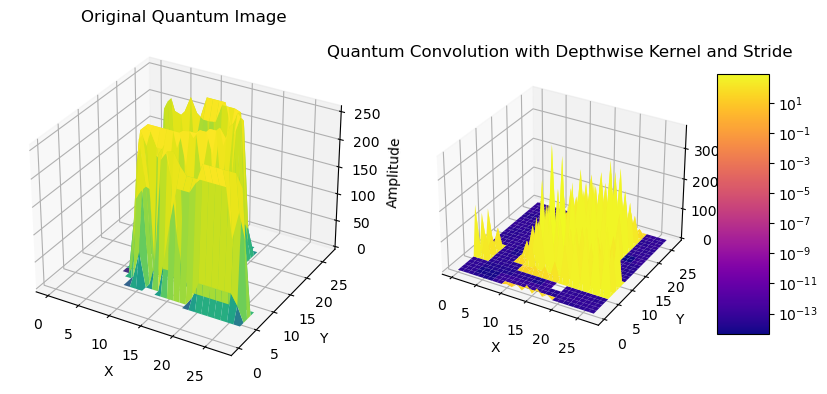

Validation Accuracy: 0.10666666666666667

Confusion Matrix:
[[   0    7    4    1    1 1158    0    4    0    0]
 [   0    0    0    0    0 1322    0    0    0    0]
 [   0   31   69    1   32 1034    0    7    0    0]
 [   0   27   19    9   11 1150    0    3    0    0]
 [   0   30    0    0    9 1119    0   18    0    0]
 [   0    8    4    0    2 1089    0    1    0    0]
 [   0   34   12    0   48 1079    0    4    0    0]
 [   0  256   42    3    1  893    0  104    0    0]
 [   0    5    0    0    0 1155    0    0    0    0]
 [   0   22    2    1    2 1149    0   18    0    0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1175
           1       0.00      0.00      0.00      1322
           2       0.45      0.06      0.10      1174
           3       0.60      0.01      0.01      1219
           4       0.08      0.01      0.01      1176
           5       0.10      0.99      0.18      1104
      

C:\Users\ACER\anaconda3\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ACER\anaconda3\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ACER\anaconda3\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler


# Define quantum convolution function
def quantum_convolution(q_image, q_kernel):
    # Pad kernel to match image dimensions
    padded_q_kernel = np.pad(q_kernel, ((0, q_image.shape[0] - q_kernel.shape[0]), 
                                        (0, q_image.shape[1] - q_kernel.shape[1])), mode='constant')
    return np.fft.ifft2(np.fft.fft2(q_image) * np.fft.fft2(padded_q_kernel))


# Define quantum convolution with depthwise kernel and stride function
def quantum_conv_depthwise_stride(q_image, q_kernel, depth_multiplier, stride):
    original_shape = q_image.shape
    q_conv_depthwise_stride_result = np.zeros(original_shape, dtype=np.complex64)
    for i in range(depth_multiplier):
        q_conv_result = quantum_convolution(q_image[::stride, ::stride], q_kernel)
        upsampled_q_conv_result = np.zeros(original_shape, dtype=np.complex64)
        upsampled_q_conv_result[::stride, ::stride] = q_conv_result
        q_conv_depthwise_stride_result += upsampled_q_conv_result
    return q_conv_depthwise_stride_result


# Visualize quantum convolution with depthwise kernel and stride
def visualize_quantum_conv_depthwise_stride(q_image, q_kernel, q_conv_depthwise_stride_result):
    fig = plt.figure(figsize=(12, 6))

    ax1 = fig.add_subplot(131, projection='3d')
    x, y = np.meshgrid(np.arange(q_image.shape[1]), np.arange(q_image.shape[0]))
    surf1 = ax1.plot_surface(x, y, np.abs(q_image), cmap='viridis', norm=LogNorm())
    ax1.set_title('Original Quantum Image')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Amplitude')

    ax2 = fig.add_subplot(132, projection='3d')
    x_conv, y_conv = np.meshgrid(np.arange(q_conv_depthwise_stride_result.shape[1]), 
                                 np.arange(q_conv_depthwise_stride_result.shape[0]))
    surf2 = ax2.plot_surface(x_conv, y_conv, np.abs(q_conv_depthwise_stride_result), cmap='plasma', norm=LogNorm())
    ax2.set_title('Quantum Convolution with Depthwise Kernel and Stride')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_zlabel('Amplitude')

    fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=5)

    plt.tight_layout()
    plt.show()


# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
testset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=False, transform=transform)

# Split dataset into train and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(trainset.data.numpy(), trainset.targets.numpy(), test_size=0.2, random_state=42)

# Define a sample quantum kernel for the convolution
q_kernel = np.random.rand(3, 3) + 1j * np.random.rand(3, 3)  # Sample 3x3 quantum kernel with complex coefficients

# Define parameters
depth_multiplier = 3  # Number of depthwise kernels
stride = 2  # Stride for downsampling

# Apply quantum convolution with depthwise kernel and stride
train_data_conv = []
for i in range(len(train_data)):
    q_conv_result = quantum_conv_depthwise_stride(train_data[i], q_kernel, depth_multiplier, stride)
    train_data_conv.append(q_conv_result)

# Convert list to numpy array
train_data_conv = np.array(train_data_conv)

# Visualize quantum convolution with depthwise kernel and stride
visualize_quantum_conv_depthwise_stride(train_data[0], q_kernel, train_data_conv[0])

# Flatten the data for SVM
train_data_flattened = train_data_conv.reshape(train_data_conv.shape[0], -1)
val_data_flattened = val_data.reshape(val_data.shape[0], -1)

# Standardize the data
scaler = StandardScaler()
train_data_flattened = scaler.fit_transform(np.abs(train_data_flattened))
val_data_flattened = scaler.transform(np.abs(val_data_flattened))

# Train SVM classifier
clf = SVC(kernel='linear')
clf.fit(train_data_flattened, train_labels)

# Predict on validation set
val_preds = clf.predict(val_data_flattened)

# Calculate accuracy
accuracy = accuracy_score(val_labels, val_preds)
print("Validation Accuracy:", accuracy)

# Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("\nConfusion Matrix:")
print(conf_matrix)

# Classification Report
class_report = classification_report(val_labels, val_preds)
print("\nClassification Report:")
print(class_report)


Validation Accuracy: 0.08525

Confusion Matrix:
[[ 41  90 217 276  48   6 319  57 102  19]
 [ 48 144 101  49  30  19 737  13 172   9]
 [ 52  65  69 351  70  19 339 115  54  40]
 [110  65 254 227  34  19 356  87  39  28]
 [ 60 120 142 204  76  35 138 133 257  11]
 [ 51  83 391 129  45  53 255  35  44  18]
 [ 58  60  24 181  12  49 315 225  66 187]
 [278  14 356 387   1  35 136  54  36   2]
 [ 76  45 362  86  21  14 486  15  43  12]
 [ 56  40 388 292   7   8 193  17 192   1]]

Classification Report:
              precision    recall  f1-score   support

           0       0.05      0.03      0.04      1175
           1       0.20      0.11      0.14      1322
           2       0.03      0.06      0.04      1174
           3       0.10      0.19      0.13      1219
           4       0.22      0.06      0.10      1176
           5       0.21      0.05      0.08      1104
           6       0.10      0.27      0.14      1177
           7       0.07      0.04      0.05      1299
          

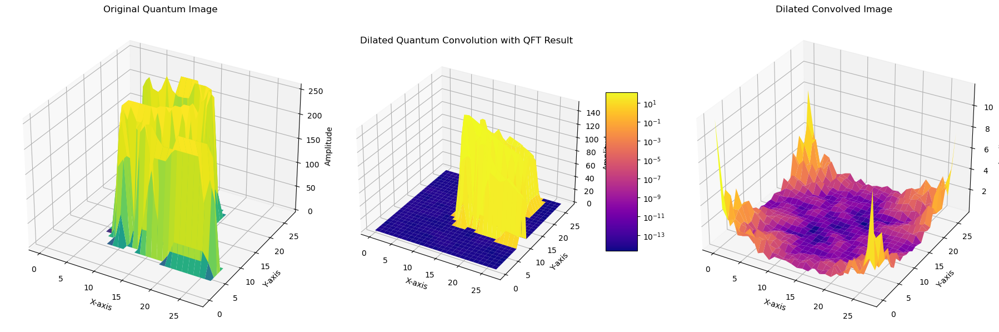

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

# Function for dilated quantum convolution with QFT
def dilated_quantum_convolution_with_qft(q_image, q_kernel, dilation_rate):
    padded_q_image = np.pad(q_image, dilation_rate * (np.array(q_kernel.shape) - 1), mode='constant')
    qft_padded_image = np.fft.fft2(padded_q_image)
    q_conv_dilated_result = np.kron(qft_padded_image, q_kernel)
    q_conv_dilated_result = np.fft.ifft2(q_conv_dilated_result)
    return q_conv_dilated_result[:28, :28]  # Ensure the shape is compatible with MNIST images

# Visualize dilated quantum convolution with QFT
def visualize_dilated_quantum_convolution_with_qft(q_image, q_kernel, dilation_rate, q_conv_dilated_result):
    fig = plt.figure(figsize=(18, 6))

    ax1 = fig.add_subplot(131, projection='3d')
    x, y = np.meshgrid(np.arange(q_image.shape[1]), np.arange(q_image.shape[0]))
    surf1 = ax1.plot_surface(x, y, np.abs(q_image), cmap='viridis', norm=LogNorm())
    ax1.set_title('Original Quantum Image')
    ax1.set_xlabel('X-axis')
    ax1.set_ylabel('Y-axis')
    ax1.set_zlabel('Amplitude')

    ax2 = fig.add_subplot(132, projection='3d')
    x_conv, y_conv = np.meshgrid(np.arange(q_conv_dilated_result.shape[1]), np.arange(q_conv_dilated_result.shape[0]))
    surf2 = ax2.plot_surface(x_conv, y_conv, np.abs(q_conv_dilated_result), cmap='plasma', norm=LogNorm())
    ax2.set_title('Dilated Quantum Convolution with QFT Result')
    ax2.set_xlabel('X-axis')
    ax2.set_ylabel('Y-axis')
    ax2.set_zlabel('Amplitude')

    fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=5)

    dilated_convolved_image = np.fft.ifft2(q_conv_dilated_result)
    ax3 = fig.add_subplot(133, projection='3d')
    x_conv, y_conv = np.meshgrid(np.arange(dilated_convolved_image.shape[1]), np.arange(dilated_convolved_image.shape[0]))
    surf3 = ax3.plot_surface(x_conv, y_conv, np.abs(dilated_convolved_image), cmap='plasma', norm=LogNorm())
    ax3.set_title('Dilated Convolved Image')
    ax3.set_xlabel('X-axis')
    ax3.set_ylabel('Y-axis')
    ax3.set_zlabel('Amplitude')

    plt.tight_layout()
    plt.show()

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
testset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=False, transform=transform)

# Split dataset into train and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(trainset.data.numpy(), trainset.targets.numpy(), test_size=0.2, random_state=42)

# Define a sample quantum kernel for the convolution
q_kernel = np.random.rand(3, 3) + 1j * np.random.rand(3, 3)  # Sample 3x3 quantum kernel with complex coefficients

# Apply dilated quantum convolution with QFT
dilation_rate = 2
train_data_conv = []
for i in range(len(train_data)):
    q_conv_result = dilated_quantum_convolution_with_qft(train_data[i], q_kernel, dilation_rate)
    train_data_conv.append(q_conv_result)

# Convert list to numpy array
train_data_conv = np.array(train_data_conv)

# Use the magnitude of the complex values for further processing
train_data_abs = np.abs(train_data_conv)
val_data_abs = np.abs(val_data)

# Flatten the data for SVM
train_data_flattened = train_data_abs.reshape(train_data_abs.shape[0], -1)
val_data_flattened = val_data_abs.reshape(val_data_abs.shape[0], -1)

# Standardize the data
scaler = StandardScaler()
train_data_flattened = scaler.fit_transform(train_data_flattened)
val_data_flattened = scaler.transform(val_data_flattened)

# Train SVM classifier
clf = SVC(kernel='linear')
clf.fit(train_data_flattened, train_labels)

# Predict on validation set
val_preds = clf.predict(val_data_flattened)

# Calculate accuracy
accuracy = accuracy_score(val_labels, val_preds)
print("Validation Accuracy:", accuracy)

# Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("\nConfusion Matrix:")
print(conf_matrix)

# Classification Report
class_report = classification_report(val_labels, val_preds)
print("\nClassification Report:")
print(class_report)

# Visualize dilated quantum convolution with QFT
visualize_dilated_quantum_convolution_with_qft(train_data[0].reshape(28, 28), q_kernel, dilation_rate, train_data_conv[0])


Validation Accuracy: 0.4230833333333333

Confusion Matrix:
[[  45    7  441    0   11  616   10   28    0   17]
 [   0 1235    6    0    0   81    0    0    0    0]
 [   0  151  773   67   18  132   18   13    0    2]
 [   1  173  132  268    4  615    3   18    0    5]
 [   0   60   66    5  675  290    0   57    0   23]
 [   0   25   35   14    4 1015    5    4    0    2]
 [   2   78  273    2  191  334  285   11    1    0]
 [   0  184  160   17   58  224    0  627    1   28]
 [   0  122  212   19    4  767    4    6   13   13]
 [   1   50   54    2  189  586    0  171    0  141]]

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.04      0.07      1175
           1       0.59      0.93      0.72      1322
           2       0.36      0.66      0.46      1174
           3       0.68      0.22      0.33      1219
           4       0.58      0.57      0.58      1176
           5       0.22      0.92      0.35      1104
       

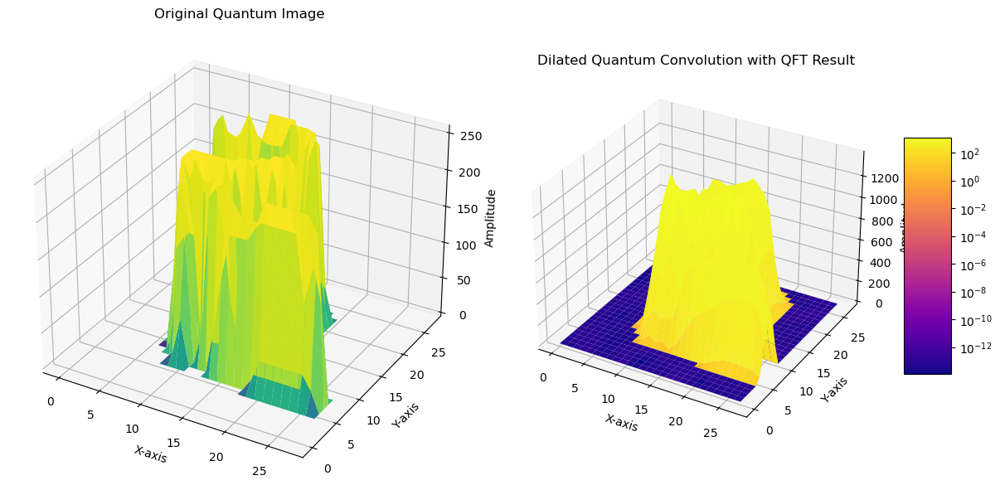

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

# Function for dilated quantum convolution with QFT
def dilated_quantum_convolution_with_qft(q_image, q_kernel, dilation_rate):
    padded_q_image = np.pad(q_image, ((0, dilation_rate * (q_kernel.shape[0] - 1)), 
                                      (0, dilation_rate * (q_kernel.shape[1] - 1))), mode='constant')
    qft_padded_image = np.fft.fft2(padded_q_image)
    qft_kernel = np.fft.fft2(q_kernel, s=padded_q_image.shape)
    q_conv_dilated_result = np.fft.ifft2(qft_padded_image * qft_kernel)
    return q_conv_dilated_result[:q_image.shape[0], :q_image.shape[1]]  # Ensure the shape is compatible with MNIST images

# Visualize dilated quantum convolution with QFT
def visualize_dilated_quantum_convolution_with_qft(q_image, q_kernel, dilation_rate, q_conv_dilated_result):
    fig = plt.figure(figsize=(18, 6))

    ax1 = fig.add_subplot(131, projection='3d')
    x, y = np.meshgrid(np.arange(q_image.shape[1]), np.arange(q_image.shape[0]))
    surf1 = ax1.plot_surface(x, y, np.abs(q_image), cmap='viridis', norm=LogNorm())
    ax1.set_title('Original Quantum Image')
    ax1.set_xlabel('X-axis')
    ax1.set_ylabel('Y-axis')
    ax1.set_zlabel('Amplitude')

    ax2 = fig.add_subplot(132, projection='3d')
    x_conv, y_conv = np.meshgrid(np.arange(q_conv_dilated_result.shape[1]), np.arange(q_conv_dilated_result.shape[0]))
    surf2 = ax2.plot_surface(x_conv, y_conv, np.abs(q_conv_dilated_result), cmap='plasma', norm=LogNorm())
    ax2.set_title('Dilated Quantum Convolution with QFT Result')
    ax2.set_xlabel('X-axis')
    ax2.set_ylabel('Y-axis')
    ax2.set_zlabel('Amplitude')

    fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=5)

    plt.tight_layout()
    plt.show()

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
testset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=False, transform=transform)

# Split dataset into train and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(trainset.data.numpy(), trainset.targets.numpy(), test_size=0.2, random_state=42)

# Define a sample quantum kernel for the convolution
q_kernel = np.random.rand(3, 3) + 1j * np.random.rand(3, 3)  # Sample 3x3 quantum kernel with complex coefficients

# Apply dilated quantum convolution with QFT
dilation_rate = 2
train_data_conv = []
for i in range(len(train_data)):
    q_conv_result = dilated_quantum_convolution_with_qft(train_data[i], q_kernel, dilation_rate)
    train_data_conv.append(q_conv_result[:28, :28])

# Convert list to numpy array
train_data_conv = np.array(train_data_conv)

# Use the magnitude of the complex values for further processing
train_data_abs = np.abs(train_data_conv)
val_data_abs = np.abs(val_data)

# Flatten the data for SVM
train_data_flattened = train_data_abs.reshape(train_data_abs.shape[0], -1)
val_data_flattened = val_data_abs.reshape(val_data_abs.shape[0], -1)

# Standardize the data
scaler = StandardScaler()
train_data_flattened = scaler.fit_transform(train_data_flattened)
val_data_flattened = scaler.transform(val_data_flattened)

# Train SVM classifier
clf = SVC(kernel='linear')
clf.fit(train_data_flattened, train_labels)

# Predict on validation set
val_preds = clf.predict(val_data_flattened)

# Calculate accuracy
accuracy = accuracy_score(val_labels, val_preds)
print("Validation Accuracy:", accuracy)

# Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("\nConfusion Matrix:")
print(conf_matrix)

# Classification Report
class_report = classification_report(val_labels, val_preds)
print("\nClassification Report:")
print(class_report)

# Visualize dilated quantum convolution with QFT
visualize_dilated_quantum_convolution_with_qft(train_data[0].reshape(28, 28), q_kernel, dilation_rate, train_data_conv[0])


Validation Accuracy: 0.056416666666666664

Confusion Matrix:
[[ 66  33 227 233 114  14  41 175 265   7]
 [ 47  17 412  23 223  70 119 166 220  25]
 [164 127 127  99  87  14  63 281 192  20]
 [132 110 179  93 107  13 203 198 139  45]
 [ 55  77 335 261 111  36  83 148  21  49]
 [ 75  63 339 145  43  86 153  96  51  53]
 [ 52 239 408  69  22 102  23 197  43  22]
 [ 42 125 324 424  50  22 242  22  21  27]
 [ 32  30 413  98  90  12 262  76 132  15]
 [  7  22 640 376  34   8  77  27   3   0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.10      0.06      0.07      1175
           1       0.02      0.01      0.02      1322
           2       0.04      0.11      0.06      1174
           3       0.05      0.08      0.06      1219
           4       0.13      0.09      0.11      1176
           5       0.23      0.08      0.12      1104
           6       0.02      0.02      0.02      1177
           7       0.02      0.02      0.02      12

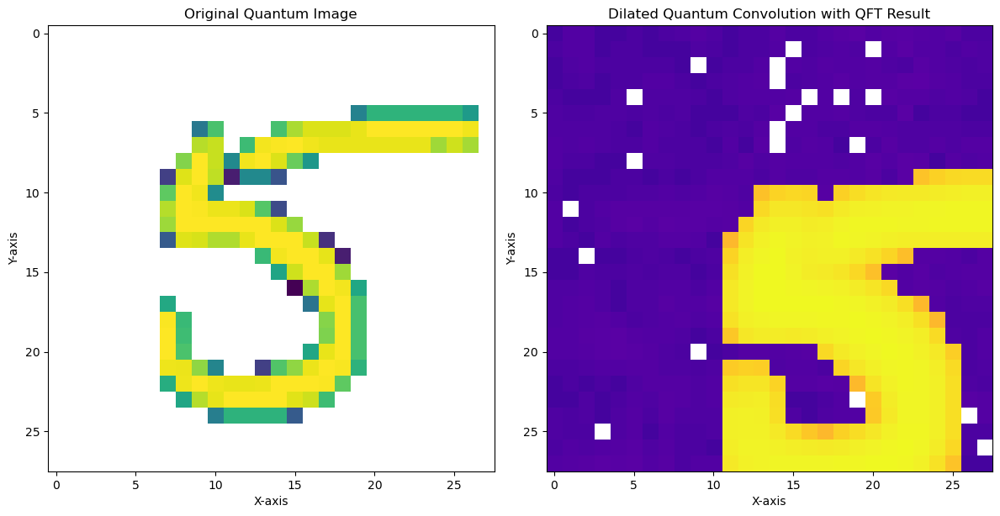

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

# Function for dilated quantum convolution with QFT
def dilated_quantum_convolution_with_qft(q_image, q_kernel, dilation_rate):
    padded_q_image = np.pad(q_image, ((dilation_rate * (q_kernel.shape[0] - 1), dilation_rate * (q_kernel.shape[0] - 1)), 
                                      (dilation_rate * (q_kernel.shape[1] - 1), dilation_rate * (q_kernel.shape[1] - 1))), mode='constant')
    qft_padded_image = np.fft.fft2(padded_q_image)
    qft_kernel = np.fft.fft2(q_kernel, s=qft_padded_image.shape)
    q_conv_dilated_result = np.fft.ifft2(qft_padded_image * qft_kernel)
    return q_conv_dilated_result[:q_image.shape[0], :q_image.shape[1]]  # Ensure the shape is compatible with MNIST images

# Visualize dilated quantum convolution with QFT
def visualize_dilated_quantum_convolution_with_qft(q_image, q_conv_dilated_result):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    axes[0].imshow(np.abs(q_image), cmap='viridis', norm=LogNorm())
    axes[0].set_title('Original Quantum Image')
    axes[0].set_xlabel('X-axis')
    axes[0].set_ylabel('Y-axis')
    
    axes[1].imshow(np.abs(q_conv_dilated_result), cmap='plasma', norm=LogNorm())
    axes[1].set_title('Dilated Quantum Convolution with QFT Result')
    axes[1].set_xlabel('X-axis')
    axes[1].set_ylabel('Y-axis')
    
    plt.tight_layout()
    plt.show()

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
testset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=False, transform=transform)

# Split dataset into train and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(trainset.data.numpy(), trainset.targets.numpy(), test_size=0.2, random_state=42)

# Define a sample quantum kernel for the convolution
q_kernel = np.random.rand(3, 3) + 1j * np.random.rand(3, 3)  # Sample 3x3 quantum kernel with complex coefficients

# Apply dilated quantum convolution with QFT
dilation_rate = 2
train_data_conv = []
for i in range(len(train_data)):
    q_conv_result = dilated_quantum_convolution_with_qft(train_data[i], q_kernel, dilation_rate)
    train_data_conv.append(q_conv_result)

# Convert list to numpy array
train_data_conv = np.array(train_data_conv)

# Use the magnitude of the complex values for further processing
train_data_abs = np.abs(train_data_conv)
val_data_abs = np.abs(val_data)

# Flatten the data for SVM
train_data_flattened = train_data_abs.reshape(train_data_abs.shape[0], -1)
val_data_flattened = val_data_abs.reshape(val_data_abs.shape[0], -1)

# Standardize the data
scaler = StandardScaler()
train_data_flattened = scaler.fit_transform(train_data_flattened)
val_data_flattened = scaler.transform(val_data_flattened)

# Train SVM classifier
clf = SVC(kernel='linear')
clf.fit(train_data_flattened, train_labels)

# Predict on validation set
val_preds = clf.predict(val_data_flattened)

# Calculate accuracy
accuracy = accuracy_score(val_labels, val_preds)
print("Validation Accuracy:", accuracy)

# Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("\nConfusion Matrix:")
print(conf_matrix)

# Classification Report
class_report = classification_report(val_labels, val_preds)
print("\nClassification Report:")
print(class_report)

# Visualize dilated quantum convolution with QFT
visualize_dilated_quantum_convolution_with_qft(train_data[0], train_data_conv[0])


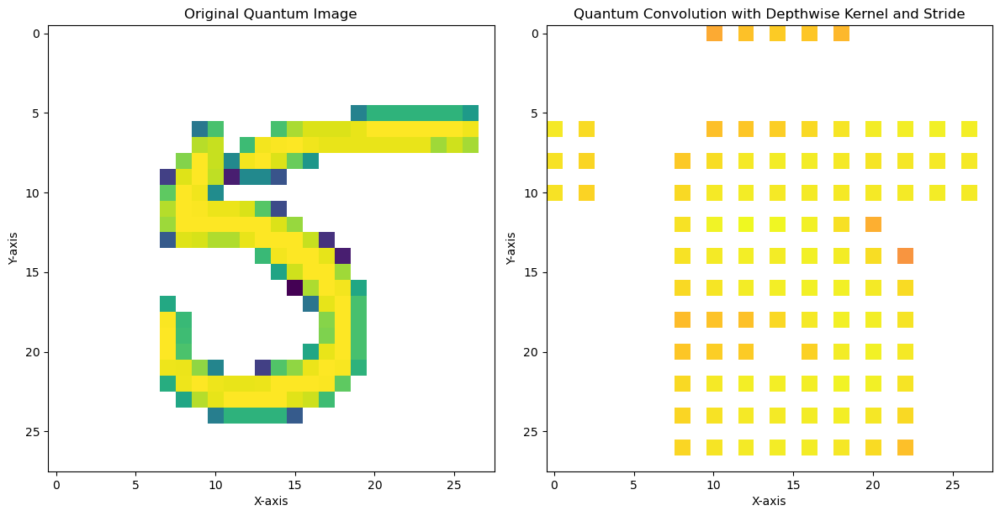

Validation Accuracy: 0.09908333333333333

Confusion Matrix:
[[   0   15    3    0    0 1153    0    4    0    0]
 [   0    1    0    0    0 1321    0    0    0    0]
 [   0   78   20    2   12 1061    0    1    0    0]
 [   0   61    6    3    0 1147    0    2    0    0]
 [   0   44    0    0    1 1125    0    6    0    0]
 [   0    9    1    0    0 1093    0    1    0    0]
 [   0   62    5    1   15 1087    0    6    1    0]
 [   0  313    1    0    0  914    0   71    0    0]
 [   0    6    0    0    0 1154    0    0    0    0]
 [   0   48    0    0    1 1143    0    2    0    0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1175
           1       0.00      0.00      0.00      1322
           2       0.56      0.02      0.03      1174
           3       0.50      0.00      0.00      1219
           4       0.03      0.00      0.00      1176
           5       0.10      0.99      0.18      1104
      

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

# Define quantum convolution function
def quantum_convolution(q_image, q_kernel):
    # Pad kernel to match image dimensions
    padded_q_kernel = np.pad(q_kernel, ((0, q_image.shape[0] - q_kernel.shape[0]), 
                                        (0, q_image.shape[1] - q_kernel.shape[1])), mode='constant')
    return np.fft.ifft2(np.fft.fft2(q_image) * np.fft.fft2(padded_q_kernel))

# Define quantum convolution with depthwise kernel and stride function
def quantum_conv_depthwise_stride(q_image, q_kernel, depth_multiplier, stride):
    original_shape = q_image.shape
    q_conv_depthwise_stride_result = np.zeros(original_shape, dtype=np.complex64)
    for i in range(depth_multiplier):
        q_conv_result = quantum_convolution(q_image[::stride, ::stride], q_kernel)
        upsampled_q_conv_result = np.zeros(original_shape, dtype=np.complex64)
        upsampled_q_conv_result[::stride, ::stride] = q_conv_result
        q_conv_depthwise_stride_result += upsampled_q_conv_result
    return q_conv_depthwise_stride_result

# Visualize quantum convolution with depthwise kernel and stride
def visualize_quantum_conv_depthwise_stride(q_image, q_conv_depthwise_stride_result):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(np.abs(q_image), cmap='viridis', norm=LogNorm())
    axes[0].set_title('Original Quantum Image')
    axes[0].set_xlabel('X-axis')
    axes[0].set_ylabel('Y-axis')
    
    axes[1].imshow(np.abs(q_conv_depthwise_stride_result), cmap='plasma', norm=LogNorm())
    axes[1].set_title('Quantum Convolution with Depthwise Kernel and Stride')
    axes[1].set_xlabel('X-axis')
    axes[1].set_ylabel('Y-axis')

    plt.tight_layout()
    plt.show()

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
testset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=False, transform=transform)

# Split dataset into train and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(trainset.data.numpy(), trainset.targets.numpy(), test_size=0.2, random_state=42)

# Define a sample quantum kernel for the convolution
q_kernel = np.random.rand(3, 3) + 1j * np.random.rand(3, 3)  # Sample 3x3 quantum kernel with complex coefficients

# Define parameters
depth_multiplier = 3  # Number of depthwise kernels
stride = 2  # Stride for downsampling

# Apply quantum convolution with depthwise kernel and stride
train_data_conv = []
for i in range(len(train_data)):
    q_conv_result = quantum_conv_depthwise_stride(train_data[i], q_kernel, depth_multiplier, stride)
    train_data_conv.append(q_conv_result)

# Convert list to numpy array
train_data_conv = np.array(train_data_conv)

# Visualize quantum convolution with depthwise kernel and stride
visualize_quantum_conv_depthwise_stride(train_data[0], train_data_conv[0])

# Flatten the data for SVM
train_data_flattened = train_data_conv.reshape(train_data_conv.shape[0], -1)
val_data_flattened = val_data.reshape(val_data.shape[0], -1)

# Standardize the data
scaler = StandardScaler()
train_data_flattened = scaler.fit_transform(np.abs(train_data_flattened))
val_data_flattened = scaler.transform(np.abs(val_data_flattened))

# Train SVM classifier
clf = SVC(kernel='linear')
clf.fit(train_data_flattened, train_labels)

# Predict on validation set
val_preds = clf.predict(val_data_flattened)

# Calculate accuracy
accuracy = accuracy_score(val_labels, val_preds)
print("Validation Accuracy:", accuracy)

# Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("\nConfusion Matrix:")
print(conf_matrix)

# Classification Report
class_report = classification_report(val_labels, val_preds, zero_division=0)
print("\nClassification Report:")
print(class_report)


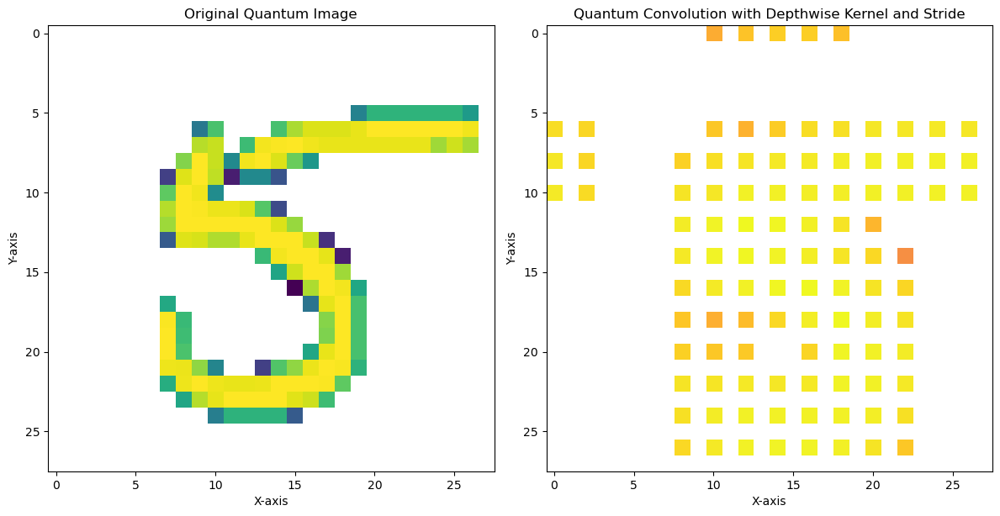

Validation Accuracy: 0.11025

Confusion Matrix:
[[   0   84   58    0   63  856    0   88    0   26]
 [   0   87    0    0    0 1235    0    0    0    0]
 [   0  196  125   10   82  741    2   13    0    5]
 [   0  258   39    2   89  813    0   17    0    1]
 [   0  144    0    0   21  955    0   52    0    4]
 [   0   83   12    1   62  907    2   16    0   21]
 [   0  173   19    0  104  713    5  155    0    8]
 [   0  253   22    0    6  897    0  117    0    4]
 [   0   77    3    0   43 1023    0    8    0    6]
 [   0  154    1    1   32  879    0   68    0   59]]

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1175
           1       0.06      0.07      0.06      1322
           2       0.45      0.11      0.17      1174
           3       0.14      0.00      0.00      1219
           4       0.04      0.02      0.03      1176
           5       0.10      0.82      0.18      1104
           6      

C:\Users\ACER\anaconda3\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ACER\anaconda3\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ACER\anaconda3\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

# Define quantum convolution function
def quantum_convolution(q_image, q_kernel):
    # Pad kernel to match image dimensions
    padded_q_kernel = np.pad(q_kernel, ((0, q_image.shape[0] - q_kernel.shape[0]), 
                                        (0, q_image.shape[1] - q_kernel.shape[1])), mode='constant')
    return np.fft.ifft2(np.fft.fft2(q_image) * np.fft.fft2(padded_q_kernel))

# Define quantum convolution with depthwise kernel and stride function
def quantum_conv_depthwise_stride(q_image, q_kernel, depth_multiplier, stride):
    original_shape = q_image.shape
    q_conv_depthwise_stride_result = np.zeros(original_shape, dtype=np.complex64)
    for i in range(depth_multiplier):
        q_conv_result = quantum_convolution(q_image[::stride, ::stride], q_kernel)
        upsampled_q_conv_result = np.zeros(original_shape, dtype=np.complex64)
        upsampled_q_conv_result[::stride, ::stride] = q_conv_result
        q_conv_depthwise_stride_result += upsampled_q_conv_result
    return q_conv_depthwise_stride_result

# Visualize quantum convolution with depthwise kernel and stride
def visualize_quantum_conv_depthwise_stride(q_image, q_conv_depthwise_stride_result):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(np.abs(q_image), cmap='viridis', norm=LogNorm())
    axes[0].set_title('Original Quantum Image')
    axes[0].set_xlabel('X-axis')
    axes[0].set_ylabel('Y-axis')
    
    axes[1].imshow(np.abs(q_conv_depthwise_stride_result), cmap='plasma', norm=LogNorm())
    axes[1].set_title('Quantum Convolution with Depthwise Kernel and Stride')
    axes[1].set_xlabel('X-axis')
    axes[1].set_ylabel('Y-axis')

    plt.tight_layout()
    plt.show()

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
testset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=False, transform=transform)

# Split dataset into train and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(trainset.data.numpy(), trainset.targets.numpy(), test_size=0.2, random_state=42)

# Define a sample quantum kernel for the convolution
q_kernel = np.random.rand(3, 3) + 1j * np.random.rand(3, 3)  # Sample 3x3 quantum kernel with complex coefficients

# Define parameters
depth_multiplier = 3  # Number of depthwise kernels
stride = 2  # Stride for downsampling

# Apply quantum convolution with depthwise kernel and stride
train_data_conv = []
for i in range(len(train_data)):
    q_conv_result = quantum_conv_depthwise_stride(train_data[i], q_kernel, depth_multiplier, stride)
    train_data_conv.append(q_conv_result)

# Convert list to numpy array
train_data_conv = np.array(train_data_conv)

# Visualize quantum convolution with depthwise kernel and stride
visualize_quantum_conv_depthwise_stride(train_data[0], train_data_conv[0])

# Flatten the data for SVM
train_data_flattened = train_data_conv.reshape(train_data_conv.shape[0], -1)
val_data_flattened = val_data.reshape(val_data.shape[0], -1)

# Standardize the data
scaler = StandardScaler()
train_data_flattened = scaler.fit_transform(np.abs(train_data_flattened))
val_data_flattened = scaler.transform(np.abs(val_data_flattened))

# Train SVM classifier
clf = SVC(kernel='linear')
clf.fit(train_data_flattened, train_labels)

# Predict on validation set
val_preds = clf.predict(val_data_flattened)

# Calculate accuracy
accuracy = accuracy_score(val_labels, val_preds)
print("Validation Accuracy:", accuracy)

# Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_preds)
print("\nConfusion Matrix:")
print(conf_matrix)

# Classification Report
class_report = classification_report(val_labels, val_preds)
print("\nClassification Report:")
print(class_report)



ValueError: cannot reshape array of size 12544 into shape (14,14)

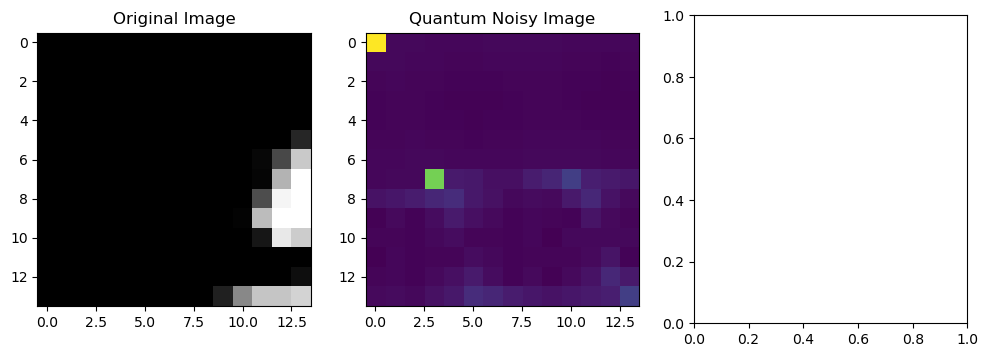

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Convert the dataset to NumPy arrays
dataiter = iter(trainloader)
images, _ = dataiter.__next__()
noisy_image = images.numpy()

# Standardize the pixel values to be between 0 and 1
noisy_image = noisy_image.astype(np.float32) / 255.0

# Take a subset of the image to reduce memory usage
subset_size = 14  # You can adjust this size based on your available memory
noisy_image_subset = noisy_image[:, :, :subset_size, :subset_size]

# Define a function to perform the Fourier transform in chunks
def chunked_fft(x, chunk_size):
    size = x.shape[0]
    chunks = np.array_split(x, size // chunk_size, axis=0)
    transformed_chunks = []

    for chunk in chunks:
        # Perform the 1D Fourier transform directly on the 1D chunk
        transformed_chunk = np.fft.fft(chunk)

        # Store the transformed chunk
        transformed_chunks.append(transformed_chunk)

    transformed_image = np.concatenate(transformed_chunks, axis=0)
    return transformed_image

# Quantum image denoising
q_noisy_image = chunked_fft(noisy_image_subset.flatten(), chunk_size=100)
q_noise = chunked_fft(np.random.normal(0, 0.1, noisy_image_subset.flatten().shape), chunk_size=100)

q_denoised_image = np.fft.ifft(np.fft.ifft(q_noisy_image) - np.fft.ifft(q_noise)).real

# Determine the shape for reshaping the 1D array back to 2D
reshaped_q_noisy_image = q_noisy_image.reshape(noisy_image_subset.shape)

# Plot the original, noisy, and denoised images
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(noisy_image_subset[0][0], cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(np.abs(reshaped_q_noisy_image[0][0]), cmap='viridis')  # Reshaped image
plt.title('Quantum Noisy Image')

# Reshape q_denoised_image to match the shape of noisy_image_subset
denoised_image_shape = noisy_image_subset[0][0].shape
plt.subplot(1, 3, 3)
plt.imshow(np.abs(q_denoised_image).reshape(denoised_image_shape), cmap='gray')
plt.title('Quantum Denoised Image')

plt.show()


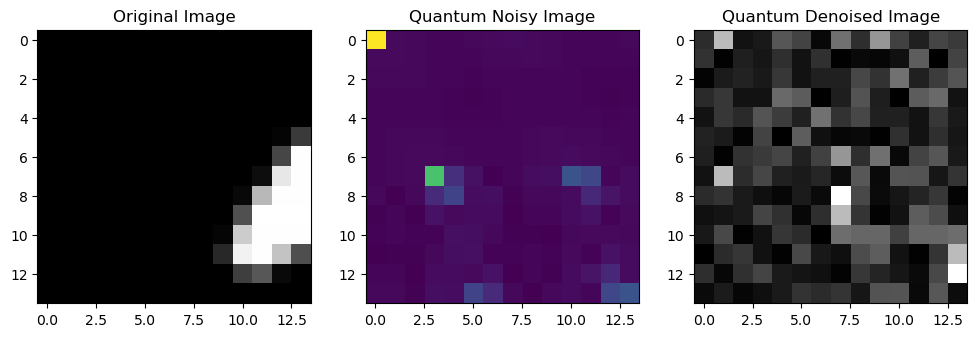

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Convert the dataset to NumPy arrays
dataiter = iter(trainloader)
images, _ = dataiter.__next__()
noisy_image = images.numpy()

# Standardize the pixel values to be between 0 and 1
noisy_image = noisy_image.astype(np.float32) / 255.0

# Take a subset of the image to reduce memory usage
subset_size = 14  # You can adjust this size based on your available memory
noisy_image_subset = noisy_image[:, :, :subset_size, :subset_size]

# Flatten the subset for Fourier transforms
flattened_noisy_image_subset = noisy_image_subset.flatten()

# Define a function to perform the Fourier transform in chunks
def chunked_fft(x, chunk_size):
    size = x.shape[0]
    chunks = np.array_split(x, size // chunk_size, axis=0)
    transformed_chunks = []

    for chunk in chunks:
        # Perform the 1D Fourier transform directly on the 1D chunk
        transformed_chunk = np.fft.fft(chunk)

        # Store the transformed chunk
        transformed_chunks.append(transformed_chunk)

    transformed_image = np.concatenate(transformed_chunks, axis=0)
    return transformed_image

# Quantum image denoising
q_noisy_image = chunked_fft(flattened_noisy_image_subset, chunk_size=100)
q_noise = chunked_fft(np.random.normal(0, 0.1, flattened_noisy_image_subset.shape), chunk_size=100)

q_denoised_image = np.fft.ifft(np.fft.ifft(q_noisy_image) - np.fft.ifft(q_noise)).real

# Reshape q_denoised_image to match the original noisy image subset shape
q_denoised_image = q_denoised_image.reshape(noisy_image_subset.shape)

# Plot the original, noisy, and denoised images
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(noisy_image_subset[0][0], cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(np.abs(q_noisy_image).reshape(noisy_image_subset.shape[0], noisy_image_subset.shape[2], noisy_image_subset.shape[3])[0], cmap='viridis')
plt.title('Quantum Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(np.abs(q_denoised_image[0][0]), cmap='gray')
plt.title('Quantum Denoised Image')

plt.show()


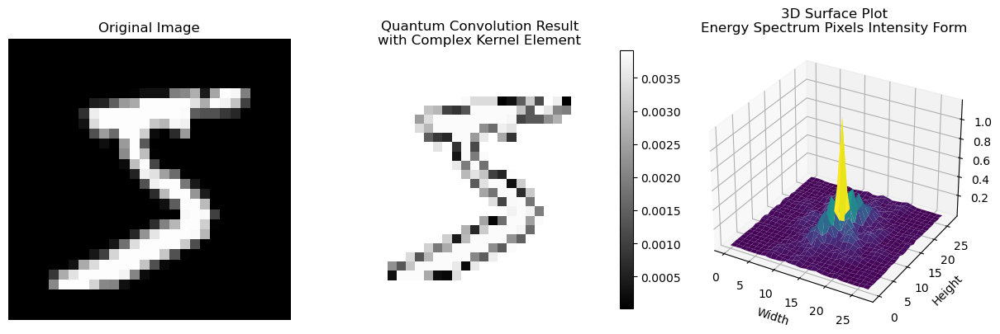

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Import Axes3D for 3D plotting
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image from the dataset
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define a complex coefficient and a quantum kernel element
alpha = np.exp(1j * np.pi / 4)  # 45-degree phase shift
q_kernel_i = np.exp(1j * np.pi / 6)  # 30-degree phase shift (example value)

# Define the quantum convolution operation with a complex kernel element
def quantum_convolution_complex(q_pixel, alpha, q_kernel_element):
    return alpha * (q_pixel * q_kernel_element)

# Perform the quantum convolution operation
result_complex_kernel = quantum_convolution_complex(image, alpha, q_kernel_i)

# Calculate the absolute Fourier transform of the quantum convolution result
energy_spectrum = np.abs(np.fft.fftshift(np.fft.fft2(result_complex_kernel[0])))

# Plotting the results
plt.figure(figsize=(12, 6))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(image[0], cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Quantum Convolution Result with Complex Kernel Element
plt.subplot(1, 3, 2)
plt.imshow(np.abs(result_complex_kernel[0]), cmap='gray')
plt.title('Quantum Convolution Result\nwith Complex Kernel Element')
plt.colorbar(fraction=0.046, pad=0.04)
plt.axis('off')

# 3D Surface Plot for Energy Spectrum
fig = plt.subplot(1, 3, 3, projection='3d')
x, y = np.meshgrid(np.arange(result_complex_kernel[0].shape[1]), np.arange(result_complex_kernel[0].shape[0]))
surf = fig.plot_surface(x, y, np.log(energy_spectrum + 1), cmap='viridis')
plt.title('3D Surface Plot\nEnergy Spectrum Pixels Intensity Form')
plt.xlabel('Width')
plt.ylabel('Height')
plt.tight_layout()

plt.show()


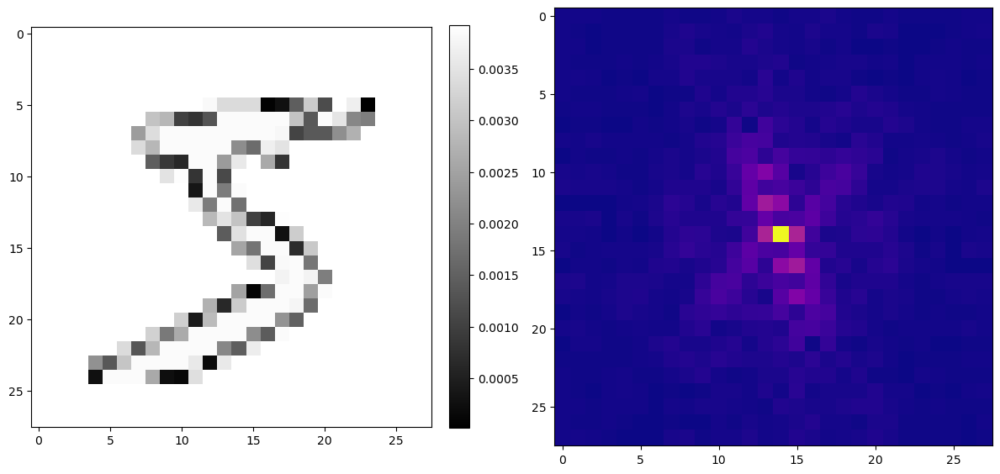

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define a complex coefficient and a quantum kernel element
alpha = np.exp(1j * np.pi / 4)  # 45-degree phase shift
q_kernel_i = np.exp(1j * np.pi / 6)  # 30-degree phase shift (example value)

# Define the quantum convolution operation with a complex kernel element
def quantum_convolution_complex(q_pixel, alpha, q_kernel_element):
    return alpha * (q_pixel * q_kernel_element)

# Perform the quantum convolution operation
result_complex_kernel = quantum_convolution_complex(image, alpha, q_kernel_i)

# Calculate the absolute Fourier transform of the quantum convolution result
energy_spectrum = np.abs(np.fft.fftshift(np.fft.fft2(result_complex_kernel[0])))

# Plot the original image, quantum convolution result, and energy spectrum
fig = plt.figure(figsize=(12, 6))



# Quantum Convolution Result with Complex Kernel Element
ax2 = fig.add_subplot(1, 2, 1)
im = ax2.imshow(np.abs(result_complex_kernel[0]), cmap='gray')
fig.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)

# Energy Spectrum Pixels Intensity Form
ax3 = fig.add_subplot(1, 2, 2)
ax3.imshow(np.log(energy_spectrum + 1), cmap='plasma')


plt.tight_layout()

plt.savefig("1b.svg", format="svg")

plt.show()


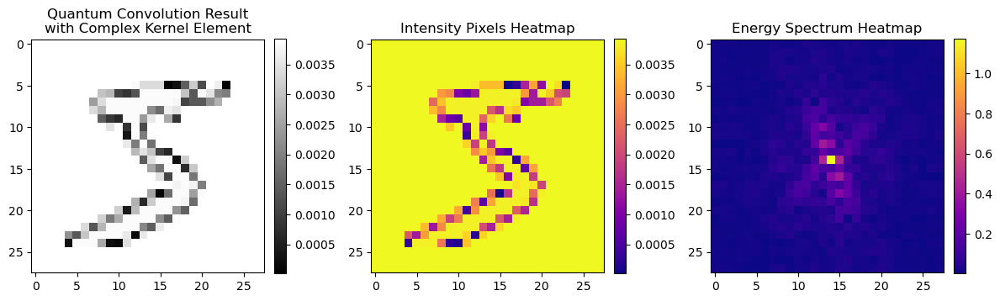

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define a complex coefficient and a quantum kernel element
alpha = np.exp(1j * np.pi / 4)  # 45-degree phase shift
q_kernel_i = np.exp(1j * np.pi / 6)  # 30-degree phase shift (example value)

# Define the quantum convolution operation with a complex kernel element
def quantum_convolution_complex(q_pixel, alpha, q_kernel_element):
    return alpha * (q_pixel * q_kernel_element)

# Perform the quantum convolution operation
result_complex_kernel = quantum_convolution_complex(image, alpha, q_kernel_i)

# Calculate the absolute Fourier transform of the quantum convolution result
energy_spectrum = np.abs(np.fft.fftshift(np.fft.fft2(result_complex_kernel[0])))

# Plot the original image, quantum convolution result, and energy spectrum
fig = plt.figure(figsize=(12, 10))


# Quantum Convolution Result with Complex Kernel Element
ax2 = fig.add_subplot(2, 3, 1)
im = ax2.imshow(np.abs(result_complex_kernel[0]), cmap='gray')
ax2.set_title('Quantum Convolution Result\nwith Complex Kernel Element')
fig.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)

# Intensity Pixels Heatmap
ax3 = fig.add_subplot(2, 3, 2)
heatmap = ax3.imshow(np.abs(result_complex_kernel[0]), cmap='plasma')
ax3.set_title('Intensity Pixels Heatmap')
fig.colorbar(heatmap, ax=ax3, fraction=0.046, pad=0.04)

# Energy Spectrum Heatmap
ax4 = fig.add_subplot(2, 3, 3)
spectrum_heatmap = ax4.imshow(np.log(energy_spectrum + 1), cmap='plasma')
ax4.set_title('Energy Spectrum Heatmap')
fig.colorbar(spectrum_heatmap, ax=ax4, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


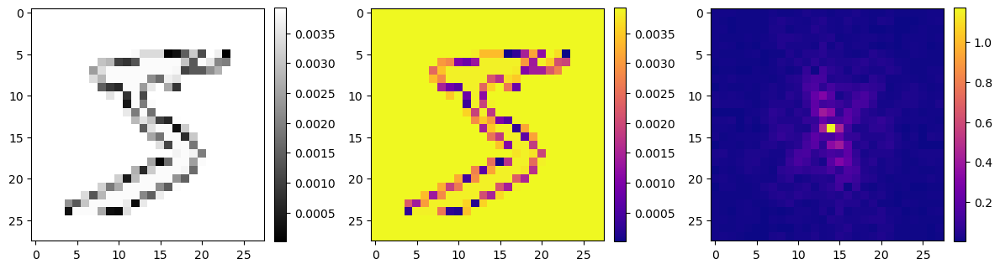

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define a complex coefficient and a quantum kernel element
alpha = np.exp(1j * np.pi / 4)  # 45-degree phase shift
q_kernel_i = np.exp(1j * np.pi / 6)  # 30-degree phase shift (example value)

# Define the quantum convolution operation with a complex kernel element
def quantum_convolution_complex(q_pixel, alpha, q_kernel_element):
    return alpha * (q_pixel * q_kernel_element)

# Perform the quantum convolution operation
result_complex_kernel = quantum_convolution_complex(image, alpha, q_kernel_i)

# Calculate the absolute Fourier transform of the quantum convolution result
energy_spectrum = np.abs(np.fft.fftshift(np.fft.fft2(result_complex_kernel[0])))

# Plot the original image, quantum convolution result, and energy spectrum
fig = plt.figure(figsize=(12, 10))


# Quantum Convolution Result with Complex Kernel Element
ax2 = fig.add_subplot(2, 3, 1)
im = ax2.imshow(np.abs(result_complex_kernel[0]), cmap='gray')
fig.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)

# Intensity Pixels Heatmap
ax3 = fig.add_subplot(2, 3, 2)
heatmap = ax3.imshow(np.abs(result_complex_kernel[0]), cmap='plasma')
fig.colorbar(heatmap, ax=ax3, fraction=0.046, pad=0.04)

# Energy Spectrum Heatmap
ax4 = fig.add_subplot(2, 3, 3)
spectrum_heatmap = ax4.imshow(np.log(energy_spectrum + 1), cmap='plasma')
fig.colorbar(spectrum_heatmap, ax=ax4, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


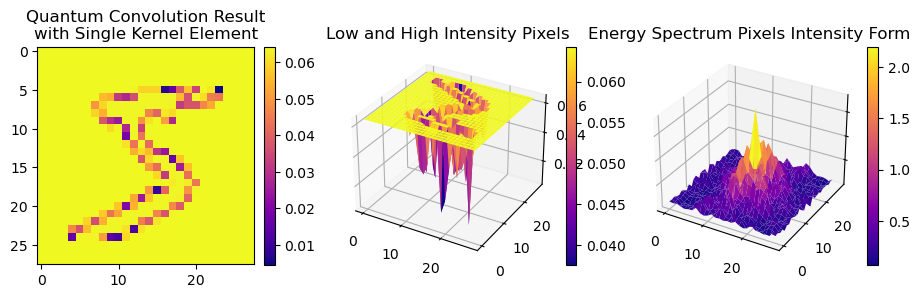

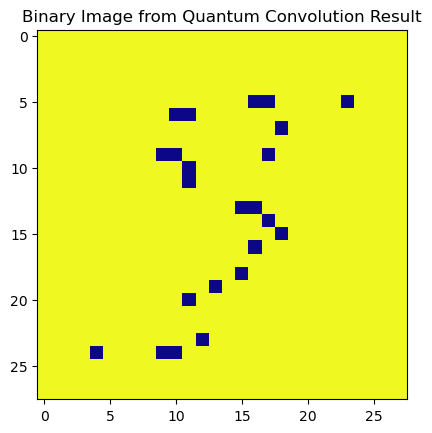

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define a complex coefficient and a quantum kernel element
magnitude_pixel = np.abs(image)
theta_pixel = np.angle(image)

magnitude_kernel_i = np.abs(1 + 1j)  # Example magnitude of kernel element
theta_kernel_i = np.angle(1 + 1j)  # Example phase of kernel element

# Define the quantum convolution operation with a single kernel element
def quantum_convolution_single_kernel(q_pixel_magnitude, q_pixel_phase, q_kernel_magnitude, q_kernel_phase):
    # Hadamard product
    q_result_magnitude = q_pixel_magnitude * q_kernel_magnitude
    q_result_phase = q_pixel_phase + q_kernel_phase
    
    # Hermitian conjugate
    q_result_magnitude *= q_kernel_magnitude
    q_result_phase -= q_kernel_phase
    
    # Incorporating amplitude estimation accuracy
    p = np.abs(q_result_magnitude)
    P = 100  # Example iteration count for amplitude estimation
    q_result_magnitude = np.abs(q_result_magnitude) + 2 * np.pi * np.sqrt(p * (1 - p) / P) + (np.pi / P)**2
    
    return q_result_magnitude * np.exp(1j * q_result_phase)

# Perform the quantum convolution operation
result_single_kernel = quantum_convolution_single_kernel(magnitude_pixel, theta_pixel, magnitude_kernel_i, theta_kernel_i)

# Calculate the absolute Fourier transform of the quantum convolution result
energy_spectrum = np.abs(np.fft.fftshift(np.fft.fft2(result_single_kernel[0])))

# Plot the original image, quantum convolution result, and 3D surface plot of the energy spectrum
fig = plt.figure(figsize=(12, 10))


# Quantum Convolution Result with Single Kernel Element
ax2 = fig.add_subplot(2, 4, 1)
im2 = ax2.imshow(np.abs(result_single_kernel[0]), cmap='plasma')  # Change colormap to 'viridis'
ax2.set_title('Quantum Convolution Result\nwith Single Kernel Element')
fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

# 3D Surface Plot for Low and High Intensity Pixels
ax3 = fig.add_subplot(2, 4, 2, projection='3d')
x, y = np.meshgrid(np.arange(result_single_kernel[0].shape[1]), np.arange(result_single_kernel[0].shape[0]))
surf = ax3.plot_surface(x, y, np.abs(result_single_kernel[0]), cmap='plasma')  # Change colormap to 'viridis'
ax3.set_title('Low and High Intensity Pixels')
fig.colorbar(surf, ax=ax3, fraction=0.046, pad=0.04)

# 3D Surface Plot for Energy Spectrum Pixels Intensity Form
ax4 = fig.add_subplot(2, 4, 3, projection='3d')
surf = ax4.plot_surface(x, y, np.log(energy_spectrum + 1), cmap='plasma')  # Change colormap to 'viridis'
ax4.set_title('Energy Spectrum Pixels Intensity Form')
fig.colorbar(surf, ax=ax4, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig("1c.svg", format="svg")
plt.show()

# Convert the quantum convolution result to binary with 28x28 dimensions
binary_result = np.abs(result_single_kernel[0]) > np.max(np.abs(result_single_kernel[0])) / 2

# Plot the binary image
plt.figure()
plt.imshow(binary_result, cmap='plasma')  # Change colormap to 'viridis'
plt.title('Binary Image from Quantum Convolution Result')
plt.savefig("1d.svg", format="svg")
plt.show()

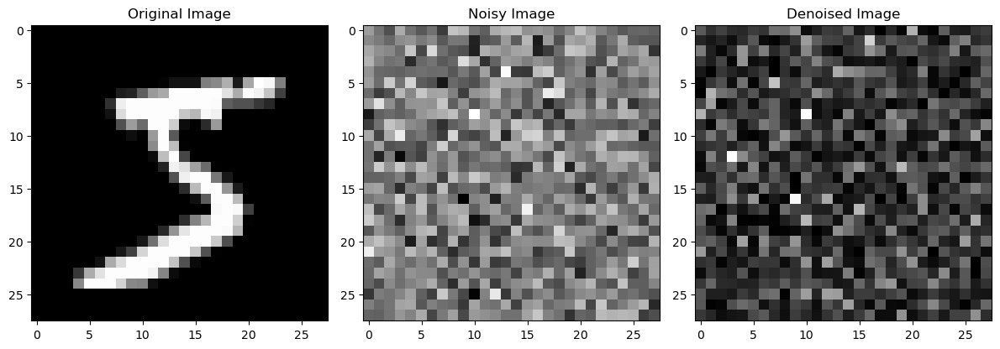

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define the quantum Fourier transform operation
def quantum_fourier_transform(q_image):
    size = q_image.shape[2]
    qft_result = np.zeros((size, size), dtype=np.complex64)

    for q in range(size):
        qft_result[q, :] = np.exp(-2j * np.pi * np.arange(size) * q) * q_image[:, :, q]

    return qft_result

# Define the inverse quantum Fourier transform operation
def inverse_quantum_fourier_transform(qft_result):
    size = qft_result.shape[0]
    iqft_result = np.zeros((1, 1, size, size), dtype=np.complex64)

    for q in range(size):
        iqft_result[0, 0, :, q] = np.exp(2j * np.pi * np.arange(size) * q) * qft_result[q, :]

    return iqft_result

# Generate noisy image (for demonstration purposes)
noisy_image = image + 0.1 * np.random.normal(size=image.shape)

# Perform quantum Fourier transform on the noisy image
q_noisy_image = quantum_fourier_transform(noisy_image)

# Generate quantum noise (for demonstration purposes)
q_noise = 0.05 * np.random.normal(size=image.shape)

# Denoise the quantum image
q_denoised_image = inverse_quantum_fourier_transform(q_noisy_image - quantum_fourier_transform(q_noise))

# Plot the original image, noisy image, and denoised image
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image[0], cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(noisy_image[0], cmap='gray')
plt.title('Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(np.abs(q_denoised_image[0, 0]).astype(float), cmap='gray')
plt.title('Denoised Image')

plt.tight_layout()
plt.show()


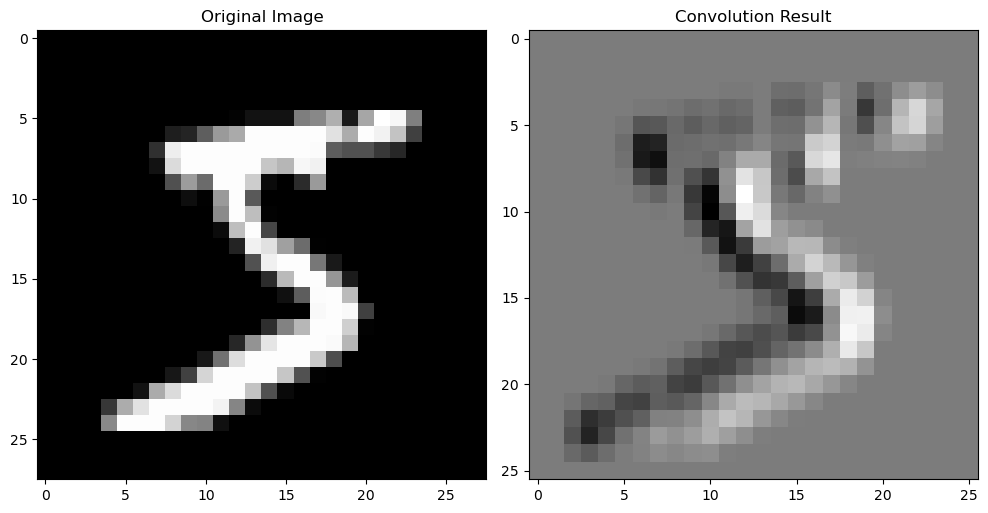

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define a 3x3 convolutional kernel
kernel = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])

# Perform the convolution operation
def convolution_operation(input_image, convolution_kernel):
    image_height, image_width = input_image.shape
    kernel_size = convolution_kernel.shape[0]
    
    output_image = np.zeros((image_height - kernel_size + 1, image_width - kernel_size + 1))
    
    for i in range(output_image.shape[0]):
        for j in range(output_image.shape[1]):
            output_image[i, j] = np.sum(input_image[i:i+kernel_size, j:j+kernel_size] * convolution_kernel)
    
    return output_image

# Apply the convolution operation
convolution_result = convolution_operation(image[0], kernel)

# Plot the original image and convolution result
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image[0], cmap='gray')
plt.title('Original Image')

# Convolution Result
plt.subplot(1, 2, 2)
plt.imshow(convolution_result, cmap='gray')
plt.title('Convolution Result')

plt.tight_layout()
plt.savefig("1e.svg",format="svg")
plt.show()


C:\Users\ACER\AppData\Local\Temp\ipykernel_1224\3779419815.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i, j] = alpha * (padded_q_pixel[i, j] * q_kernel_element)


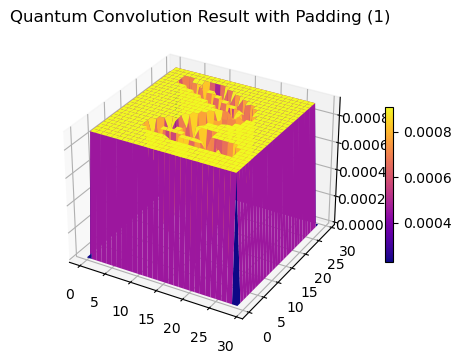

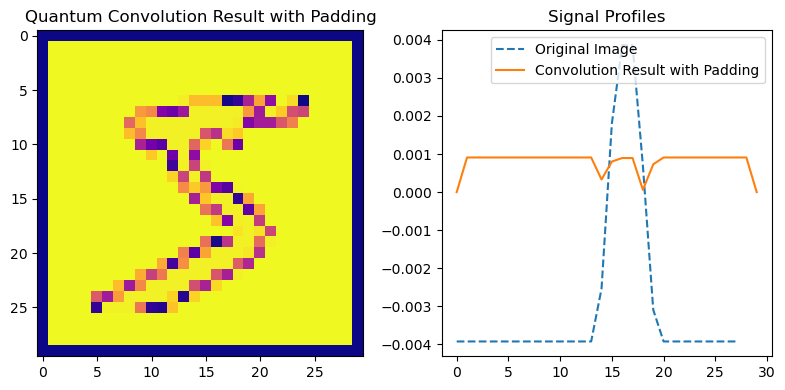

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define the quantum convolution operation with padding
def quantum_convolution_padding(q_pixel, alpha, q_kernel_element, padding):
    padded_q_pixel = np.pad(q_pixel, padding, 'constant', constant_values=0)
    result = np.zeros_like(padded_q_pixel)
    for i in range(padded_q_pixel.shape[0]):
        for j in range(padded_q_pixel.shape[1]):
            result[i, j] = alpha * (padded_q_pixel[i, j] * q_kernel_element)
    return result

# Define zero-padding amount using the formula: P = (K - 1) // 2
kernel_size = 3  # Example kernel size
padding_amount = (kernel_size - 1) // 2
result_conv_padding = quantum_convolution_padding(image[0], alpha, q_kernel_i, padding_amount)

# Create a meshgrid for 3D plot
x, y = np.meshgrid(np.arange(result_conv_padding.shape[1]), np.arange(result_conv_padding.shape[0]))

# Plot the 3D surface plot
fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, np.abs(result_conv_padding), cmap='plasma', color='red')
ax.set_title(f'Quantum Convolution Result with Padding ({padding_amount})')
fig.colorbar(surf, ax=ax, fraction=0.01, pad=0.04)
# Signal processing analysis
plt.figure(figsize=(12, 4))



# Quantum Convolution Result with Padding
plt.subplot(131)
plt.imshow(np.abs(result_conv_padding), cmap='plasma')
plt.title('Quantum Convolution Result with Padding')

# Plot 1D signal profiles
plt.subplot(132)
profile_original = image[0, result_conv_padding.shape[0] // 2, :]
profile_conv = np.abs(result_conv_padding[result_conv_padding.shape[0] // 2, :])
plt.plot(profile_original, label='Original Image', linestyle='--')
plt.plot(profile_conv, label='Convolution Result with Padding', linestyle='-')
plt.title('Signal Profiles')
plt.legend()

plt.tight_layout()

plt.savefig("1f.svg", format="svg")
plt.show()


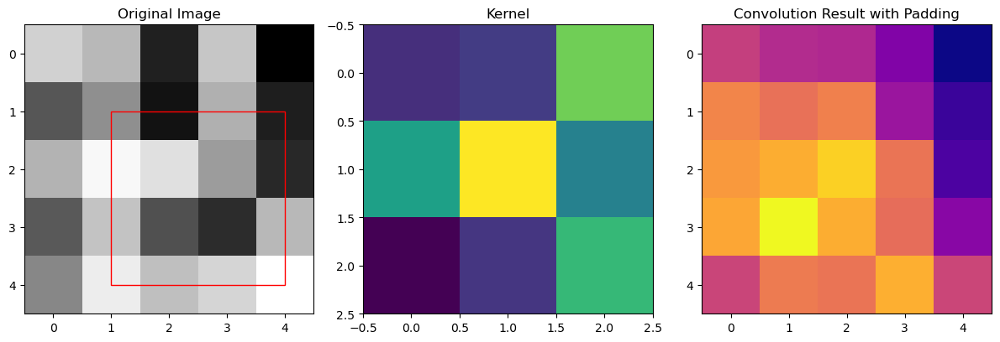

In [90]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Function to perform 2D convolution with padding
def convolve_with_padding(image, kernel, padding):
    padded_image = np.pad(image, padding, mode='constant', constant_values=0)
    result = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            result[i, j] = np.sum(padded_image[i:i+kernel.shape[0], j:j+kernel.shape[1]] * kernel)
    return result

# Function to visualize the convolution with padding process
def visualize_padding_convolution(image, kernel, padding):
    # Perform convolution with padding
    result = convolve_with_padding(image, kernel, padding)

    # Plot the original image
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')

    # Plot the kernel
    plt.subplot(132)
    plt.imshow(kernel, cmap='viridis')
    plt.title('Kernel')

    # Plot the padded image
    plt.subplot(133)
    plt.imshow(result, cmap='plasma')
    plt.title('Convolution Result with Padding')

    # Highlight the padded region in the original image
    plt.subplot(131)
    rect = Rectangle((padding, padding), image.shape[1] - 2 * padding, image.shape[0] - 2 * padding,
                     linewidth=1, edgecolor='red', facecolor='none')
    plt.gca().add_patch(rect)

    plt.tight_layout()
    plt.savefig("1g.svg", format="svg")
    plt.show()

# Example usage
image_size = 5
image = np.random.rand(image_size, image_size)
kernel_size = 3
kernel = np.random.rand(kernel_size, kernel_size)
padding_amount = (kernel_size - 1) // 2  # Zero-padding

visualize_padding_convolution(image, kernel, padding_amount)


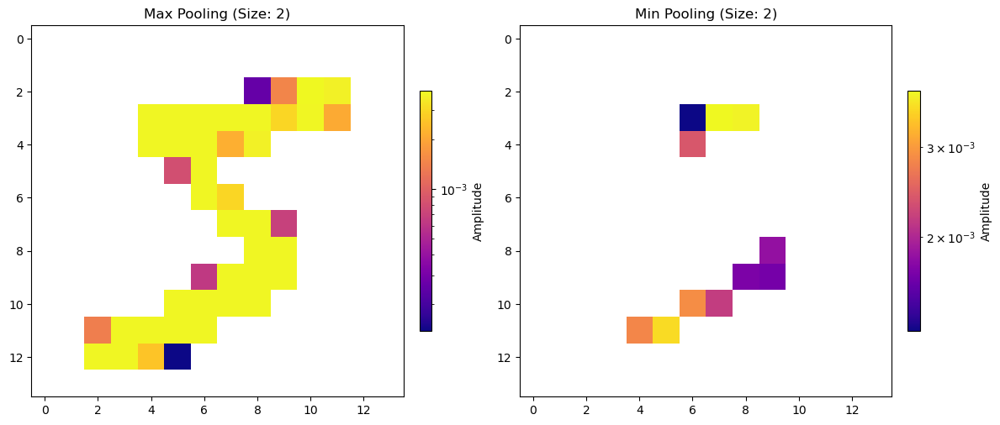

In [103]:
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Function for max pooling
def max_pooling(input_image, pool_size):
    pooled_result = np.zeros((input_image.shape[1] // pool_size, input_image.shape[2] // pool_size))
    for i in range(0, input_image.shape[1], pool_size):
        for j in range(0, input_image.shape[2], pool_size):
            pooled_result[i // pool_size, j // pool_size] = np.max(input_image[0, i:i + pool_size, j:j + pool_size])
    return pooled_result

# Function for min pooling
def min_pooling(input_image, pool_size):
    pooled_result = np.zeros((input_image.shape[1] // pool_size, input_image.shape[2] // pool_size))
    for i in range(0, input_image.shape[1], pool_size):
        for j in range(0, input_image.shape[2], pool_size):
            pooled_result[i // pool_size, j // pool_size] = np.min(input_image[0, i:i + pool_size, j:j + pool_size])
    return pooled_result

# Create a figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Max pooling
pool_size_max = 2
pooled_result_max = max_pooling(image, pool_size_max)

axes[0].imshow(pooled_result_max, cmap='viridis', norm=LogNorm())
axes[0].set_title(f'Max Pooling (Size: {pool_size_max})')
fig.colorbar(axes[0].imshow(pooled_result_max, cmap='plasma', norm=LogNorm()), ax=axes[0], fraction=0.030, pad=0.04, label='Amplitude')

# Min pooling
pool_size_min = 2
pooled_result_min = min_pooling(image, pool_size_min)

axes[1].imshow(pooled_result_min, cmap='viridis', norm=LogNorm())
axes[1].set_title(f'Min Pooling (Size: {pool_size_min})')
fig.colorbar(axes[1].imshow(pooled_result_min, cmap='plasma', norm=LogNorm()), ax=axes[1], fraction=0.030, pad=0.04, label='Amplitude')

plt.tight_layout()

plt.savefig("1g.svg", format="svg")
plt.show()


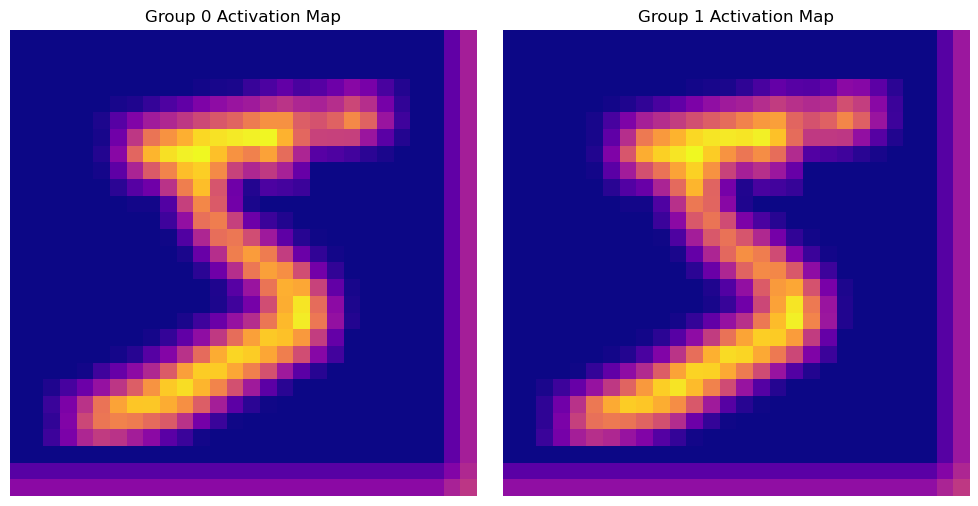

In [109]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

def grouped_convolution(image, kernels, groups):
    # Initialize the output feature map
    output = np.zeros_like(image)

    # Initialize a list to store intermediate feature maps
    activation_maps = []

    # Get the dimensions of the image, kernels, and groups
    image_shape = image.shape
    num_groups = len(groups)

    # Apply the grouped convolution
    for group_idx in range(num_groups):
        group = groups[group_idx]
        group_kernels = kernels[group]
        group_output = np.zeros_like(image)

        for i in range(image_shape[0]):
            for j in range(image_shape[1]):
                for k in range(image_shape[2]):
                    sum_val = 0
                    for kernel_idx in range(len(group_kernels)):
                        f = group_kernels[kernel_idx]
                        for l in range(f.shape[0]):
                            for m in range(f.shape[1]):
                                for n in range(f.shape[2]):
                                    if (
                                        i + l < image_shape[0]
                                        and j + m < image_shape[1]
                                        and k + n < image_shape[2]
                                    ):
                                        sum_val += f[l, m, n] * image[i + l, j + m, k + n]

                    # Correctly reshape sum_val to (1,)
                    sum_val = sum_val.reshape(1)
                    group_output[i, j, k] = sum_val

        # Accumulate the output for each group
        output += group_output

        # Append the intermediate feature map to the list
        activation_maps.append(np.copy(output))

    return output, activation_maps

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define grouped convolution with 32 filters, 3x3 kernel size, and 4 groups
kernels = np.random.rand(4, 3, 3, 3)  # Example random kernels with consistent dimensions
groups = [[0, 1], [2, 3]]  # Example grouping

# Apply the grouped convolution
output_feature_map, activation_maps = grouped_convolution(image.reshape(1, 28, 28, 1), kernels, groups)

# Visualize Activation Maps
num_groups = len(groups)
fig, axs = plt.subplots(1, num_groups + 0, figsize=(10, 5))


# Visualize Activation Maps for each group
for idx in range(num_groups):
    axs[idx + 0].imshow(activation_maps[idx][0, :, :, 0], cmap='plasma')
    axs[idx + 0].set_title(f'Group {idx + 0} Activation Map')
    axs[idx + 0].axis('off')

plt.tight_layout()
plt.savefig("1h.svg",  format="svg")
plt.show()


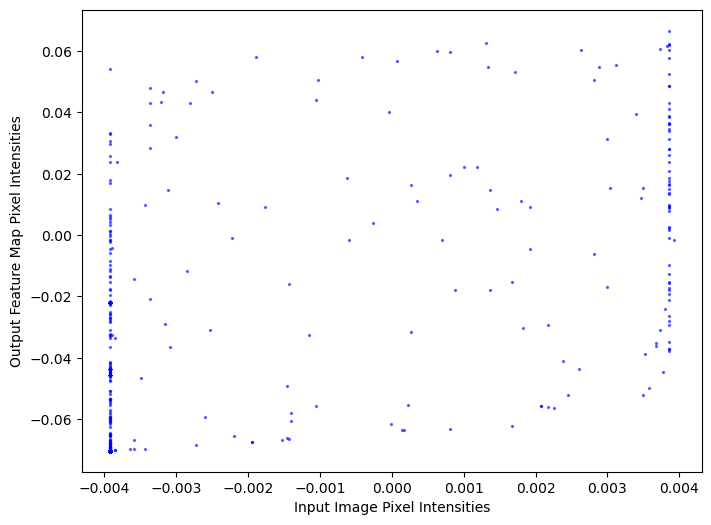

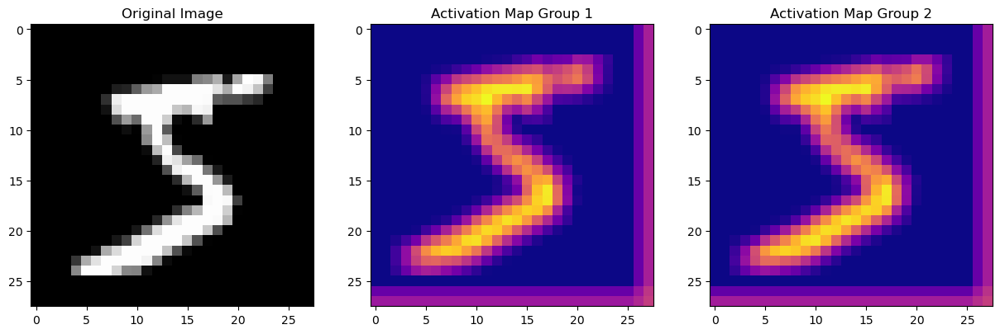

In [110]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

def grouped_convolution(image, kernels, groups):
    # Initialize the output feature map
    output = np.zeros_like(image)

    # Initialize a list to store intermediate feature maps
    activation_maps = []

    # Get the dimensions of the image, kernels, and groups
    image_shape = image.shape
    num_groups = len(groups)

    # Apply the grouped convolution
    for group_idx in range(num_groups):
        group = groups[group_idx]
        group_kernels = kernels[group]
        group_output = np.zeros_like(image)

        for i in range(image_shape[0]):
            for j in range(image_shape[1]):
                for k in range(image_shape[2]):
                    sum_val = 0
                    for kernel_idx in range(len(group_kernels)):
                        f = group_kernels[kernel_idx]
                        for l in range(f.shape[0]):
                            for m in range(f.shape[1]):
                                for n in range(f.shape[2]):
                                    if (
                                        i + l < image_shape[0]
                                        and j + m < image_shape[1]
                                        and k + n < image_shape[2]
                                    ):
                                        sum_val += f[l, m, n] * image[i + l, j + m, k + n]

                    # Correctly reshape sum_val to (1,)
                    sum_val = sum_val.reshape(1)
                    group_output[i, j, k] = sum_val

        # Accumulate the output for each group
        output += group_output

        # Append the intermediate feature map to the list
        activation_maps.append(np.copy(output))

    return output, activation_maps

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define grouped convolution with 32 filters, 3x3 kernel size, and 4 groups
kernels = np.random.rand(4, 3, 3, 3)  # Example random kernels with consistent dimensions
groups = [[0, 1], [2, 3]]  # Example grouping

# Apply the grouped convolution
output_feature_map, activation_maps = grouped_convolution(image.reshape(1, 28, 28, 1), kernels, groups)

# Flatten the input image and output feature map for scatter plot
flatten_image = image.flatten()
flatten_output_feature_map = output_feature_map.flatten()

# Create Scatter Plot
plt.figure(figsize=(8, 6))
plt.scatter(flatten_image, flatten_output_feature_map, s=2, c='blue', alpha=0.5)
plt.xlabel('Input Image Pixel Intensities')
plt.ylabel('Output Feature Map Pixel Intensities')
plt.savefig("1i.svg",  format="svg")
plt.show()

# Visualize Activation Maps for each group
fig, axs = plt.subplots(1, len(activation_maps) + 1, figsize=(15, 5))

# Plot the original image
axs[0].imshow(image[0], cmap='gray')
axs[0].set_title('Original Image')

# Plot activation maps for each group
for i in range(len(activation_maps)):
    axs[i + 1].imshow(activation_maps[i][0, :, :, 0], cmap='plasma')
    axs[i + 1].set_title(f'Activation Map Group {i + 1}')

plt.show()


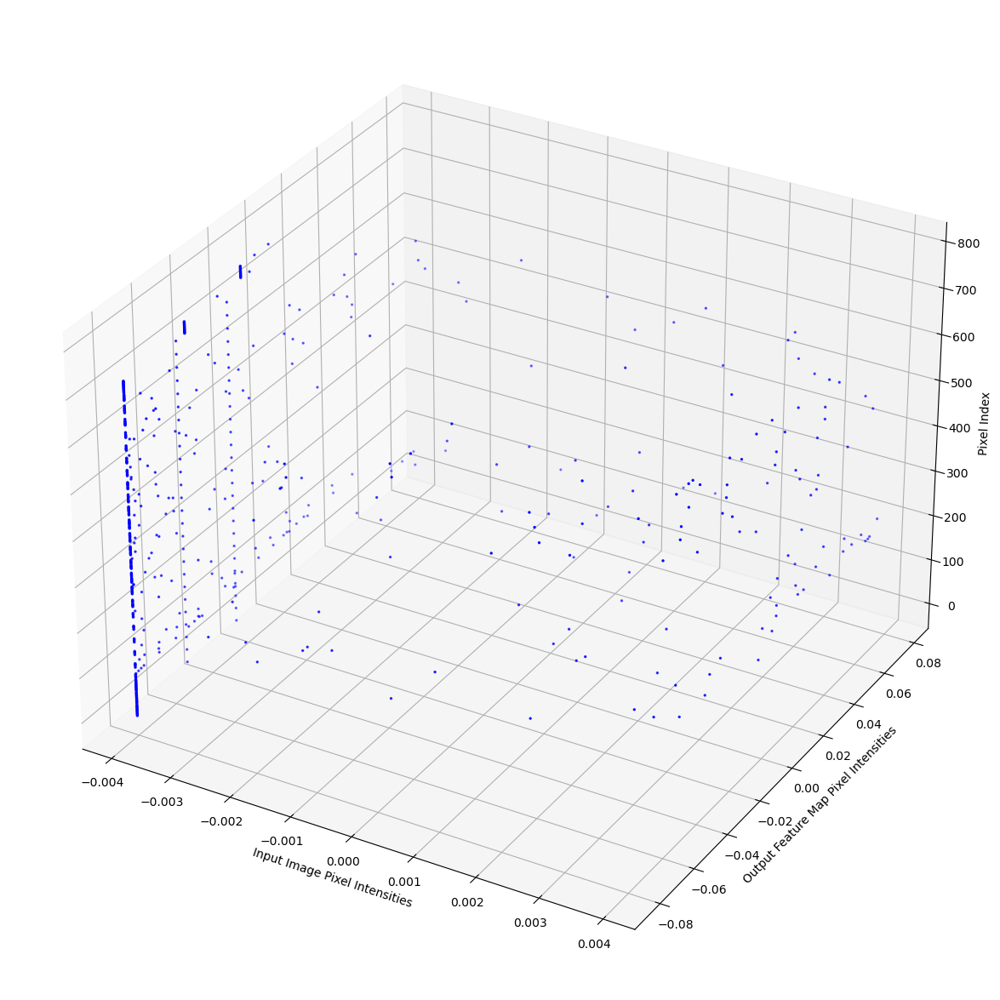

In [114]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch
from torchvision import datasets, transforms

def grouped_convolution(image, kernels, groups):
    # Initialize the output feature map
    output = np.zeros_like(image)

    # Initialize a list to store intermediate feature maps
    activation_maps = []

    # Get the dimensions of the image, kernels, and groups
    image_shape = image.shape
    num_groups = len(groups)

    # Apply the grouped convolution
    for group_idx in range(num_groups):
        group = groups[group_idx]
        group_kernels = kernels[group]
        group_output = np.zeros_like(image)

        for i in range(image_shape[0]):
            for j in range(image_shape[1]):
                for k in range(image_shape[2]):
                    sum_val = 0
                    for kernel_idx in range(len(group_kernels)):
                        f = group_kernels[kernel_idx]
                        for l in range(f.shape[0]):
                            for m in range(f.shape[1]):
                                for n in range(f.shape[2]):
                                    if (
                                        i + l < image_shape[0]
                                        and j + m < image_shape[1]
                                        and k + n < image_shape[2]
                                    ):
                                        sum_val += f[l, m, n] * image[i + l, j + m, k + n]

                    # Correctly reshape sum_val to (1,)
                    sum_val = sum_val.reshape(1)
                    group_output[i, j, k] = sum_val

        # Accumulate the output for each group
        output += group_output

        # Append the intermediate feature map to the list
        activation_maps.append(np.copy(output))

    return output, activation_maps

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1, shuffle=True)

# Take only the first image
image = trainset[0][0].numpy()

# Standardize the pixel values to be between 0 and 1
image = image.astype(np.float32) / 255.0

# Define grouped convolution with 32 filters, 3x3 kernel size, and 4 groups
kernels = np.random.rand(4, 3, 3, 3)  # Example random kernels with consistent dimensions
groups = [[0, 1], [2, 3]]  # Example grouping

# Apply the grouped convolution
output_feature_map, activation_maps = grouped_convolution(image.reshape(1, 28, 28, 1), kernels, groups)

# Create 3D Plot
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

# Flatten the input image and output feature map
flatten_image = image.flatten()
flatten_output_feature_map = output_feature_map.flatten()

# Scatter plot in 3D
ax.scatter(flatten_image, flatten_output_feature_map, range(len(flatten_image)), c='blue', marker='o', s=2)

ax.set_xlabel('Input Image Pixel Intensities')
ax.set_ylabel('Output Feature Map Pixel Intensities')
ax.set_zlabel('Pixel Index')
plt.savefig("1i.svg",  format="svg")
plt.show()


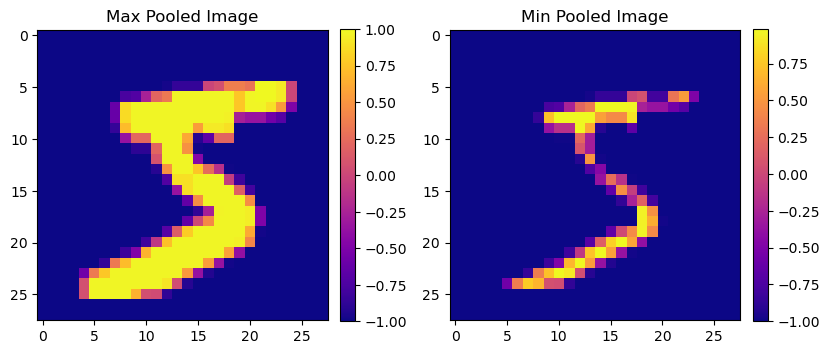

In [117]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import maximum_filter, minimum_filter
from torchvision import datasets, transforms

def max_pooling(image, pool_size):
    return maximum_filter(image, size=pool_size)

def min_pooling(image, pool_size):
    return minimum_filter(image, size=pool_size)

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
image = image.numpy()[0]

# Apply max pooling
max_pooled_result = max_pooling(image, pool_size=(2, 2))

# Apply min pooling
min_pooled_result = min_pooling(image, pool_size=(2, 2))

# Plot the results
plt.figure(figsize=(12, 4))



# Max Pooled Image
plt.subplot(131)
plt.imshow(max_pooled_result, cmap='plasma')
plt.title('Max Pooled Image')
plt.colorbar(fraction=0.046, pad=0.04)

# Min Pooled Image
plt.subplot(132)
plt.imshow(min_pooled_result, cmap='plasma')
plt.title('Min Pooled Image')
plt.colorbar(fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig("1j.svg",  format="svg")
plt.show()


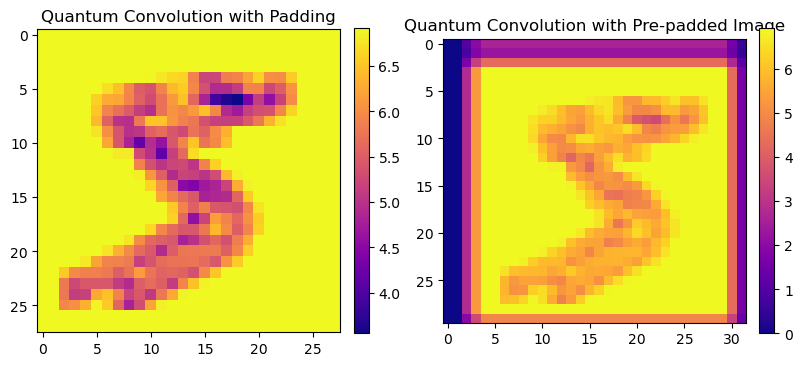

In [120]:
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

def apply_quantum_convolution(q_image, q_kernel, padding):
    # Apply Fourier Transforms to the quantum image and kernel
    F_image = np.fft.fft2(q_image)
    F_kernel = np.fft.fft2(q_kernel, s=F_image.shape)

    # Define padding parameters
    xi, eta = padding

    # Formulate quantum convolution with padding via Fourier transforms
    F_result = F_image * F_kernel * np.exp(2j * np.pi * (np.fft.fftfreq(F_image.shape[0])[:, np.newaxis] * xi +
                                                         np.fft.fftfreq(F_image.shape[1])[np.newaxis, :] * eta))

    # Apply Inverse Fourier Transform to get the final result
    result = np.fft.ifft2(F_result)

    return result

def apply_quantum_convolution_pre_padded(q_image, q_kernel, padding):
    # Pad the quantum image with zeros to match the kernel size
    padded_image = np.pad(q_image, ((padding[0],), (padding[1],)), mode='constant')

    # Apply Fourier Transforms to the padded image and kernel
    F_image = np.fft.fft2(padded_image)
    F_kernel = np.fft.fft2(q_kernel, s=F_image.shape)

    # Formulate quantum convolution with pre-padded image via Fourier transforms
    F_result = F_image * F_kernel

    # Apply Inverse Fourier Transform to get the final result
    result = np.fft.ifft2(F_result)

    return result

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Generate example quantum kernel
q_kernel_size = 3
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)

# Define padding parameters
padding_amount = (1, 2)

# Apply quantum convolution with padding
result_padding = apply_quantum_convolution(q_image, q_kernel, padding_amount)

# Apply quantum convolution with pre-padded image
result_pre_padded = apply_quantum_convolution_pre_padded(q_image, q_kernel, padding_amount)

# Plot the results
plt.figure(figsize=(12, 4))



# Quantum Convolution with Padding
plt.subplot(131)
plt.imshow(np.abs(result_padding), cmap='plasma')
plt.title('Quantum Convolution with Padding')
plt.colorbar(fraction=0.046, pad=0.04)

# Quantum Convolution with Pre-padded Image
plt.subplot(132)
plt.imshow(np.abs(result_pre_padded), cmap='plasma')
plt.title('Quantum Convolution with Pre-padded Image')
plt.colorbar(fraction=0.046, pad=0.04)

plt.tight_layout()

plt.savefig("1k.svg",  format="svg")
plt.show()


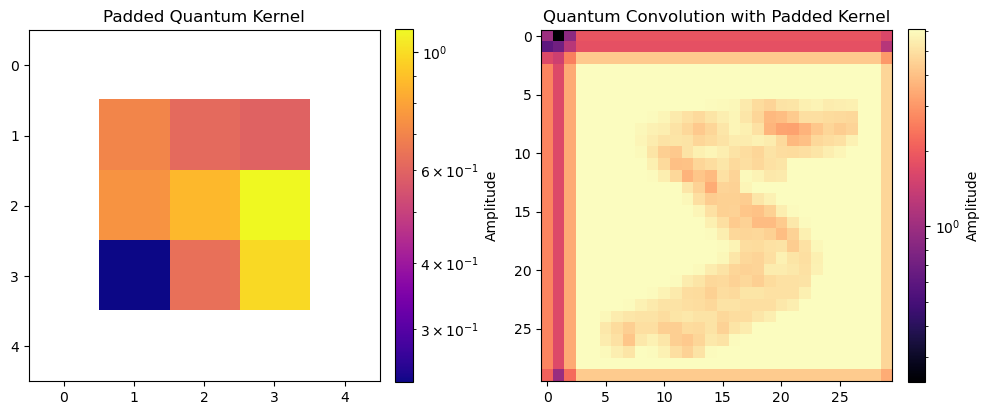

In [135]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from torchvision import datasets, transforms

def quantum_convolution_padded_kernel(q_image, q_kernel, padding):
    # Apply Fourier Transforms to the quantum image and kernel
    F_image = np.fft.fft2(np.pad(q_image, padding, mode='constant'))
    F_kernel = np.fft.fft2(q_kernel, s=F_image.shape)

    # Formulate quantum convolution with padded kernel via Fourier transforms
    F_result = F_image * F_kernel

    # Apply Inverse Fourier Transform to get the final result
    result = np.fft.ifft2(F_result)

    return result

def create_plots(q_image, q_kernel_padded, q_conv_padded_result):
    # Plot the 2D images
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Padded quantum kernel
    im1 = axs[0].imshow(np.abs(q_kernel_padded), cmap='plasma', norm=LogNorm())
    axs[0].set_title('Padded Quantum Kernel')
    fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04, label='Amplitude')

    # Quantum convolution with padded kernel
    im2 = axs[1].imshow(np.abs(q_conv_padded_result), cmap='magma', norm=LogNorm())
    axs[1].set_title('Quantum Convolution with Padded Kernel')
    fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04, label='Amplitude')

    plt.tight_layout()
    plt.savefig("1l.svg",  format="svg")
    plt.show()

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Parameters
q_kernel_size = 3
padding_amount = ((q_kernel_size - 1) // 2, (q_kernel_size - 1) // 2)  # Size of the padding based on the kernel size

# Generate random quantum kernel
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)

# Padded quantum kernel
q_kernel_padded = np.pad(q_kernel, padding_amount, mode='constant')

# Quantum convolution with padded kernel
q_conv_padded_result = quantum_convolution_padded_kernel(q_image, q_kernel, padding_amount)

# Create and show plots
create_plots(q_image, q_kernel_padded, q_conv_padded_result)


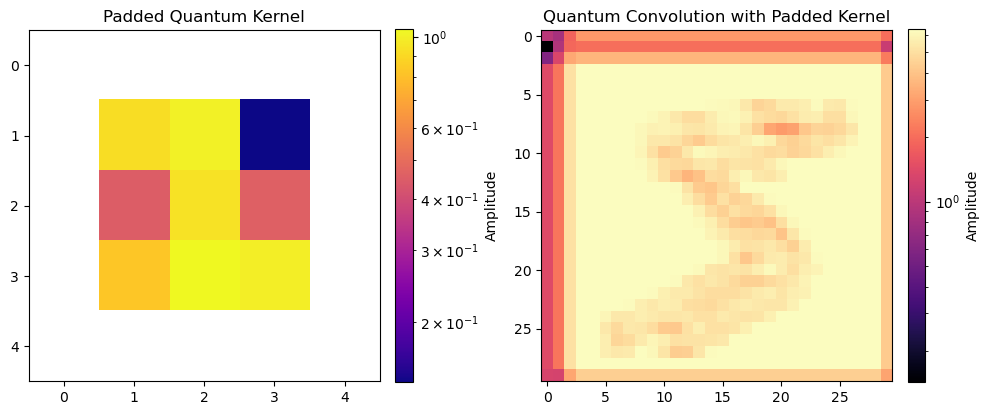

In [137]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from torchvision import datasets, transforms

def quantum_convolution_padded_kernel(q_image, q_kernel, padding):
    # Apply Fourier Transforms to the quantum image and kernel
    F_image = np.fft.fft2(np.pad(q_image, padding, mode='constant'))
    F_kernel = np.fft.fft2(q_kernel, s=F_image.shape)

    # Formulate quantum convolution with padded kernel via Fourier transforms
    F_result = F_image * F_kernel

    # Apply Inverse Fourier Transform to get the final result
    result = np.fft.ifft2(F_result)

    return result

def create_plots(q_image, q_kernel_padded, q_conv_padded_result):
    # Plot the 2D images
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Padded quantum kernel
    im1 = axs[0].imshow(np.abs(q_kernel_padded), cmap='plasma', norm=LogNorm())
    axs[0].set_title('Padded Quantum Kernel')
    fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04, label='Amplitude')

    # Quantum convolution with padded kernel
    im2 = axs[1].imshow(np.abs(q_conv_padded_result), cmap='magma', norm=LogNorm())
    axs[1].set_title('Quantum Convolution with Padded Kernel')
    fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04, label='Amplitude')

    plt.tight_layout()
    plt.savefig("1l.svg",  format="svg") 
    plt.show()

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Parameters
q_kernel_size = 3
padding_amount = ((q_kernel_size - 1) // 2, (q_kernel_size - 1) // 2)  # Size of the padding based on the kernel size

# Generate random quantum kernel
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)

# Padded quantum kernel
q_kernel_padded = np.pad(q_kernel, padding_amount, mode='constant')

# Quantum convolution with padded kernel
q_conv_padded_result = quantum_convolution_padded_kernel(q_image, q_kernel, padding_amount)

# Create and show plots
create_plots(q_image, q_kernel_padded, q_conv_padded_result)


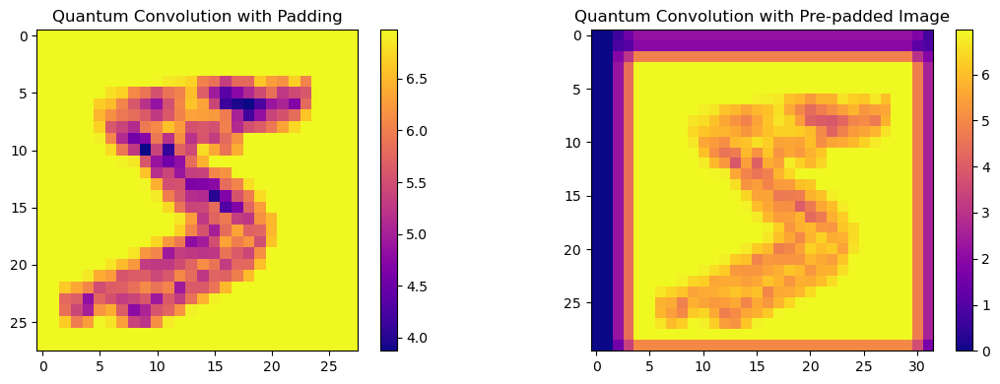

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

def apply_quantum_convolution(q_image, q_kernel, padding):
    # Apply Fourier Transforms to the quantum image and kernel
    F_image = np.fft.fft2(q_image)
    F_kernel = np.fft.fft2(q_kernel, s=F_image.shape)

    # Define padding parameters
    xi, eta = padding

    # Formulate quantum convolution with padding via Fourier transforms
    F_result = F_image * F_kernel * np.exp(2j * np.pi * (np.fft.fftfreq(F_image.shape[0])[:, np.newaxis] * xi +
                                                         np.fft.fftfreq(F_image.shape[1])[np.newaxis, :] * eta))

    # Apply Inverse Fourier Transform to get the final result
    result = np.fft.ifft2(F_result)

    return result

def apply_quantum_convolution_pre_padded(q_image, q_kernel, padding):
    # Pad the quantum image with zeros to match the kernel size
    padded_image = np.pad(q_image, ((padding[0],), (padding[1],)), mode='constant')

    # Apply Fourier Transforms to the padded image and kernel
    F_image = np.fft.fft2(padded_image)
    F_kernel = np.fft.fft2(q_kernel, s=F_image.shape)

    # Formulate quantum convolution with pre-padded image via Fourier transforms
    F_result = F_image * F_kernel

    # Apply Inverse Fourier Transform to get the final result
    result = np.fft.ifft2(F_result)

    return result

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Generate example quantum kernel
q_kernel_size = 3
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)

# Define padding parameters
padding_amount = (1, 2)

# Apply quantum convolution with padding
result_padding = apply_quantum_convolution(q_image, q_kernel, padding_amount)

# Apply quantum convolution with pre-padded image
result_pre_padded = apply_quantum_convolution_pre_padded(q_image, q_kernel, padding_amount)

# Plot the results
plt.figure(figsize=(12, 4))

# Quantum Convolution with Padding
plt.subplot(121)
plt.imshow(np.abs(result_padding), cmap='plasma')
plt.title('Quantum Convolution with Padding')
plt.colorbar(fraction=0.046, pad=0.04)

# Quantum Convolution with Pre-padded Image
plt.subplot(122)
plt.imshow(np.abs(result_pre_padded), cmap='plasma')
plt.title('Quantum Convolution with Pre-padded Image')
plt.colorbar(fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig("1k.svg", format="svg")
plt.show()


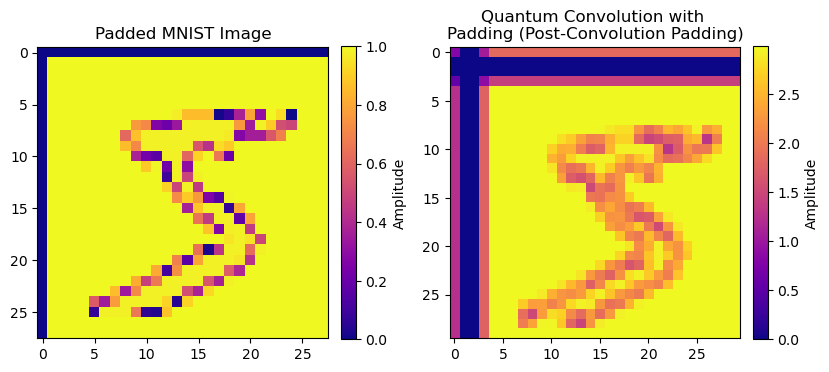

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from torchvision import datasets, transforms

def quantum_convolution_padding_via_post_convolution_padding(q_image, q_kernel, padding):
    # Pad the quantum image with zeros
    padded_image = np.pad(q_image, ((padding,), (padding,)), mode='constant')

    # Perform Fourier Transform on the padded image
    F_padded_image = fft2(padded_image)

    # Perform Fourier Transform on the padded kernel
    F_kernel = fft2(q_kernel, s=F_padded_image.shape)

    # Perform convolution with padded kernel in frequency domain
    F_result = F_padded_image * F_kernel

    # Apply Inverse Fourier Transform to get the final result
    result = ifft2(F_result)

    return result

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Set other parameters
q_kernel_size = 3
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)
padding_size = 1

# Make equal dimensions by adjusting the kernel size
q_kernel_padded = np.pad(q_kernel, ((padding_size,), (padding_size,)), mode='constant')
q_kernel_padded = q_kernel_padded[:q_kernel_size, :q_kernel_size]

# Make equal dimensions by adjusting the image size
q_image_padded = np.pad(q_image, ((padding_size,), (padding_size,)), mode='constant')
q_image_padded = q_image_padded[:q_image.shape[0], :q_image.shape[1]]

# Perform Quantum Convolution with Padding via Post-Convolution Padding
result_quantum_conv_padding_post = quantum_convolution_padding_via_post_convolution_padding(q_image_padded, q_kernel_padded, padding_size)

# Plot the results
plt.figure(figsize=(12, 4))


# Padded Quantum Image
plt.subplot(131)
plt.imshow(np.abs(q_image_padded), cmap='plasma')
plt.title('Padded MNIST Image')
plt.colorbar(fraction=0.046, pad=0.04, label='Amplitude')

# Quantum Convolution with Padding via Post-Convolution Padding
plt.subplot(132)
plt.imshow(np.abs(result_quantum_conv_padding_post), cmap='plasma')
plt.title('Quantum Convolution with \nPadding (Post-Convolution Padding)')
plt.colorbar(fraction=0.046, pad=0.04, label='Amplitude')

plt.tight_layout()
plt.savefig("1o.svg",  format="svg") 
plt.show()


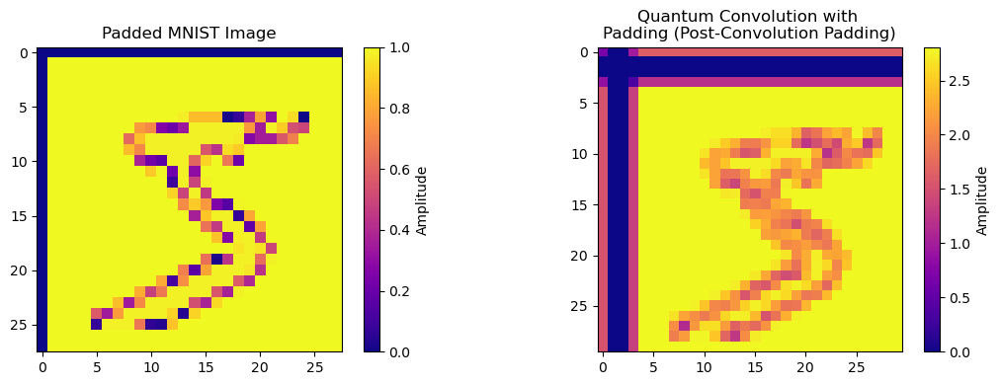

In [144]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from torchvision import datasets, transforms

def quantum_convolution_padding_via_post_convolution_padding(q_image, q_kernel, padding):
    # Pad the quantum image with zeros
    padded_image = np.pad(q_image, ((padding,), (padding,)), mode='constant')

    # Perform Fourier Transform on the padded image
    F_padded_image = fft2(padded_image)

    # Perform Fourier Transform on the padded kernel
    F_kernel = fft2(q_kernel, s=F_padded_image.shape)

    # Perform convolution with padded kernel in frequency domain
    F_result = F_padded_image * F_kernel

    # Apply Inverse Fourier Transform to get the final result
    result = ifft2(F_result)

    return result

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Set other parameters
q_kernel_size = 3
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)
padding_size = 1

# Make equal dimensions by adjusting the kernel size
q_kernel_padded = np.pad(q_kernel, ((padding_size,), (padding_size,)), mode='constant')
q_kernel_padded = q_kernel_padded[:q_kernel_size, :q_kernel_size]

# Make equal dimensions by adjusting the image size
q_image_padded = np.pad(q_image, ((padding_size,), (padding_size,)), mode='constant')
q_image_padded = q_image_padded[:q_image.shape[0], :q_image.shape[1]]

# Perform Quantum Convolution with Padding via Post-Convolution Padding
result_quantum_conv_padding_post = quantum_convolution_padding_via_post_convolution_padding(q_image_padded, q_kernel_padded, padding_size)

# Plot the results
plt.figure(figsize=(12, 4))

# Padded Quantum Image
plt.subplot(121)
plt.imshow(np.abs(q_image_padded), cmap='plasma')
plt.title('Padded MNIST Image')
plt.colorbar(fraction=0.046, pad=0.04, label='Amplitude')

# Quantum Convolution with Padding via Post-Convolution Padding
plt.subplot(122)
plt.imshow(np.abs(result_quantum_conv_padding_post), cmap='plasma')
plt.title('Quantum Convolution with \nPadding (Post-Convolution Padding)')
plt.colorbar(fraction=0.046, pad=0.04, label='Amplitude')

plt.tight_layout()
plt.savefig("1o.svg", format="svg")
plt.show()


In [153]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from torchvision import datasets, transforms
from matplotlib.colors import LogNorm

# Function for quantum convolution with complex kernel
def quantum_convolution_complex(q_pixel, alpha, q_kernel_element):
    return alpha * (q_pixel * q_kernel_element)

# Function for quantum convolution with stride
def quantum_convolution_stride(q_image, q_kernel, stride):
    result_shape = ((q_image.shape[0] - q_kernel.shape[0]) // stride + 1,
                    (q_image.shape[1] - q_kernel.shape[1]) // stride + 1,
                    q_image.shape[2])
    q_conv_stride_result = np.zeros(result_shape, dtype=np.complex64)

    for k in range(q_image.shape[2]):
        for i in range(0, q_image.shape[0] - q_kernel.shape[0] + 1, stride):
            for j in range(0, q_image.shape[1] - q_kernel.shape[1] + 1, stride):
                q_conv_stride_result[i // stride, j // stride, k] = np.sum(
                    quantum_convolution_complex(q_image[i:i + q_kernel.shape[0], j:j + q_kernel.shape[1], k],
                                                1, np.conjugate(q_kernel)))
    return q_conv_stride_result

# Function for quantum convolution with padding
def quantum_convolution_padding(q_image, q_kernel, padding):
    # Pad the quantum image with zeros
    padded_image = np.pad(q_image, ((padding,), (padding,), (0,)), mode='constant')

    # Perform quantum convolution
    q_conv_result = np.zeros_like(q_image, dtype=np.complex64)

    for k in range(q_image.shape[2]):
        for i in range(q_image.shape[0]):
            for j in range(q_image.shape[1]):
                q_conv_result[i, j, k] = np.sum(
                    quantum_convolution_complex(padded_image[i:i + q_kernel.shape[0], j:j + q_kernel.shape[1], k],
                                                1, np.conjugate(q_kernel)))
    return q_conv_result

# Function for max pooling
def max_pooling(q_image, pool_size):
    result_shape = (q_image.shape[0] // pool_size, q_image.shape[1] // pool_size, q_image.shape[2])
    pooled_result = np.zeros(result_shape, dtype=np.complex64)

    for k in range(q_image.shape[2]):
        for i in range(0, result_shape[0]):
            for j in range(0, result_shape[1]):
                pooled_result[i, j, k] = np.max(q_image[i * pool_size:(i + 1) * pool_size, j * pool_size:(j + 1) * pool_size, k])
    return pooled_result

# Function for error analysis, performance metrics, and model architecture visualization
def analyze_quantum_convolution(q_image, q_kernel, padding, stride, pool_size):
    # Perform quantum convolution with padding
    q_conv_result_padding = quantum_convolution_padding(q_image, q_kernel, padding)
    print("Shape after padding convolution:", q_conv_result_padding.shape)

    # Perform quantum convolution with stride
    q_conv_result_stride = quantum_convolution_stride(q_image, q_kernel, stride)
    print("Shape after stride convolution:", q_conv_result_stride.shape)

    # Perform quantum convolution with max pooling
    q_conv_result_pooling = max_pooling(q_conv_result_stride, pool_size)
    print("Shape after max pooling:", q_conv_result_pooling.shape)

    # Check the contents of the pooled result
    if np.all(q_conv_result_pooling == 0):
        raise ValueError("The pooled result is all zeros. Check the convolution and pooling steps.")
    
    # Prepare the data for classical SVM
    data = np.abs(q_conv_result_pooling).reshape((-1, q_image.shape[2]))
    print("Data shape for SVM:", data.shape)
    
    # Check if data array is empty
    if data.size == 0:
        raise ValueError("The data array is empty after reshaping. Check the convolution and pooling steps.")
    
    labels = np.random.randint(0, 2, size=data.shape[0])  # Replace with actual labels

    # Split the dataset into training and testing sets
    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=0.2, random_state=42)

    # Standardize the data
    scaler = StandardScaler()
    train_data_std = scaler.fit_transform(train_data)
    test_data_std = scaler.transform(test_data)

    # Train SVM model
    svm_model = SVC()
    svm_model.fit(train_data_std, train_labels)

    # Predict labels for the test set
    predicted_labels = svm_model.predict(test_data_std)

    # Evaluate the model
    accuracy = accuracy_score(test_labels, predicted_labels)
    conf_matrix = confusion_matrix(test_labels, predicted_labels)
    classification_rep = classification_report(test_labels, predicted_labels)

    # Print performance metrics
    print(f'Accuracy: {accuracy:.4f}')
    print('Confusion Matrix:')
    print(conf_matrix)
    print('Classification Report:')
    print(classification_rep)

    # Visualize model architecture
    visualize_quantum_convolution(q_image, q_kernel, padding, stride, pool_size, q_conv_result_padding,
                                  q_conv_result_stride, q_conv_result_pooling)

# Function to visualize quantum convolution results
def visualize_quantum_convolution(q_image, q_kernel, padding, stride, pool_size, q_conv_result_padding,
                                   q_conv_result_stride, q_conv_result_pooling):
    # Plot the 3D surface plots
    fig = plt.figure(figsize=(18, 8))

    # Original quantum image
    ax1 = fig.add_subplot(231, projection='3d')
    x, y = np.meshgrid(np.arange(q_image.shape[1]), np.arange(q_image.shape[0]))
    ax1.plot_surface(x, y, np.abs(q_image[:, :, 0]), cmap='viridis', norm=LogNorm())
    ax1.set_title('Original Quantum Image')

    # Quantum convolution with padding
    ax2 = fig.add_subplot(232, projection='3d')
    x_padding, y_padding = np.meshgrid(np.arange(q_conv_result_padding.shape[1]),
                                       np.arange(q_conv_result_padding.shape[0]))
    ax2.plot_surface(x_padding, y_padding, np.abs(q_conv_result_padding[:, :, 0]), cmap='plasma', norm=LogNorm())
    ax2.set_title('Quantum Convolution with Padding')

    # Quantum convolution with stride
    ax3 = fig.add_subplot(233, projection='3d')
    x_stride, y_stride = np.meshgrid(np.arange(q_conv_result_stride.shape[1]),
                                     np.arange(q_conv_result_stride.shape[0]))
    ax3.plot_surface(x_stride, y_stride, np.abs(q_conv_result_stride[:, :, 0]), cmap='magma', norm=LogNorm())
    ax3.set_title('Quantum Convolution with Stride')

    # Quantum convolution with max pooling
    ax4 = fig.add_subplot(234, projection='3d')
    x_pooling, y_pooling = np.meshgrid(np.arange(q_conv_result_pooling.shape[1]),
                                       np.arange(q_conv_result_pooling.shape[0]))
    ax4.plot_surface(x_pooling, y_pooling, np.abs(q_conv_result_pooling[:, :, 0]), cmap='viridis', norm=LogNorm())
    ax4.set_title('Quantum Convolution with Max Pooling')

    # Signal profile along the x-axis for quantum convolution with max pooling
    ax5 = fig.add_subplot(235)
    ax5.plot(np.arange(q_conv_result_pooling.shape[1]),
             np.abs(q_conv_result_pooling[q_conv_result_pooling.shape[0] // 2, :, 0]),
             label='Convolution with Max Pooling', color='blue')
    ax5.set_title('Signal Profile along X-axis (Convolution with Max Pooling)')
    ax5.set_ylabel('Amplitude')
    ax5.legend()

    # Signal profile along the y-axis for quantum convolution with max pooling
    ax6 = fig.add_subplot(236)
    ax6.plot(np.arange(q_conv_result_pooling.shape[0]),
             np.abs(q_conv_result_pooling[:, q_conv_result_pooling.shape[1] // 2, 0]),
             label='Convolution with Max Pooling', color='red')
    ax6.set_title('Signal Profile along Y-axis (Convolution with Max Pooling)')
    ax6.set_ylabel('Amplitude')
    ax6.legend()

    plt.tight_layout()
    plt.show()

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy())

# Ensure the quantum image has three channels
q_image = np.repeat(q_image[:, :, np.newaxis], 3, axis=2)

#Parameters for quantum convolution
q_kernel_size = 3
padding_amount = 1
stride_amount = 2
pool_size_amount = 2

#Generate random quantum kernel
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)

#Analyze quantum convolution
analyze_quantum_convolution(q_image, q_kernel, padding_amount, stride_amount, pool_size_amount)

ValueError: operands could not be broadcast together with remapped shapes [original->remapped]: (3,1)  and requested shape (4,2)

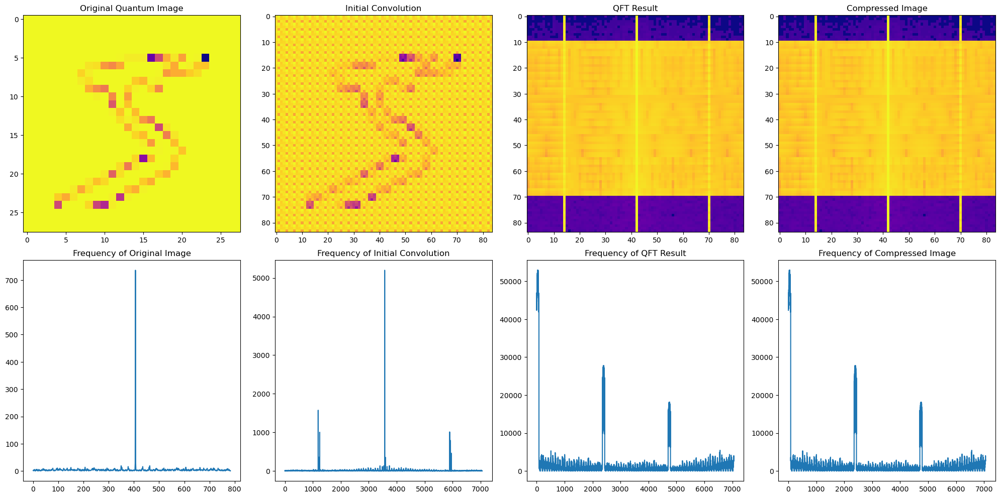

In [3]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from torchvision import datasets, transforms

# Function for quantum convolution with complex kernel element
def quantum_convolution(q_pixel, q_kernel_element, alpha=1):
    return alpha * (q_pixel * q_kernel_element)

# Initial convolution for quantum pipeline
def initial_quantum_convolution(q_pixel, q_kernel_element):
    return np.kron(q_pixel, q_kernel_element)

# Hermitian conjugate operation
def hermitian_conjugate(q_matrix):
    return np.conjugate(q_matrix.T)

# Quantum convolution with complex coefficient alpha
def quantum_convolution_complex(q_pixel, q_kernel_element, alpha):
    return alpha * quantum_convolution(q_pixel, q_kernel_element)

# Function to apply Quantum Fourier Transform (QFT)
def apply_qft(q_matrix):
    N = q_matrix.shape[0]
    qft_matrix = np.fft.fftshift(np.fft.fft2(q_matrix))
    return (1 / np.sqrt(N)) * np.exp(-2j * np.pi * np.arange(N)[:, None] * np.arange(N) / N) @ qft_matrix

# Function for image compression
def image_compression(q_matrix):
    U = np.eye(q_matrix.shape[0])  # Identity matrix for simplification
    return U @ apply_qft(q_matrix) @ hermitian_conjugate(U)

# Function to visualize quantum convolution results and their frequency graphs
def visualize_quantum_convolution(q_image, q_kernel, alpha):
    # Perform initial convolution
    initial_conv = initial_quantum_convolution(q_image, q_kernel)

    # Apply QFT
    qft_result = apply_qft(initial_conv)

    # Perform image compression
    compressed_image = image_compression(initial_conv)

    # Hermitian conjugate operation
    hermitian_result = hermitian_conjugate(compressed_image)

    # Plot the results
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))

    # Original quantum image
    axs[0, 0].imshow(np.abs(q_image), cmap='plasma', norm=LogNorm())
    axs[0, 0].set_title('Original Quantum Image')

    # Initial convolution
    axs[0, 1].imshow(np.abs(initial_conv), cmap='plasma', norm=LogNorm())
    axs[0, 1].set_title('Initial Convolution')

    # QFT result
    axs[0, 2].imshow(np.abs(qft_result), cmap='plasma', norm=LogNorm())
    axs[0, 2].set_title('QFT Result')

    # Compressed image
    axs[0, 3].imshow(np.abs(compressed_image), cmap='plasma', norm=LogNorm())
    axs[0, 3].set_title('Compressed Image')

    # Frequency graphs
    axs[1, 0].plot(np.abs(np.fft.fftshift(np.fft.fft2(q_image)).flatten()))
    axs[1, 0].set_title('Frequency of Original Image')

    axs[1, 1].plot(np.abs(np.fft.fftshift(np.fft.fft2(initial_conv)).flatten()))
    axs[1, 1].set_title('Frequency of Initial Convolution')

    axs[1, 2].plot(np.abs(np.fft.fftshift(np.fft.fft2(qft_result)).flatten()))
    axs[1, 2].set_title('Frequency of QFT Result')

    axs[1, 3].plot(np.abs(np.fft.fftshift(np.fft.fft2(compressed_image)).flatten()))
    axs[1, 3].set_title('Frequency of Compressed Image')

    plt.tight_layout()
    plt.savefig("b1.svg", format="svg")
    plt.show()

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Parameters for quantum convolution
q_kernel_size = 3
alpha = 1 + 1j  # Complex coefficient alpha

# Generate random quantum kernel element
q_kernel = np.random.rand(q_kernel_size, q_kernel_size) + 1j * np.random.rand(q_kernel_size, q_kernel_size)

# Visualize quantum convolution results
visualize_quantum_convolution(q_image, q_kernel, alpha)


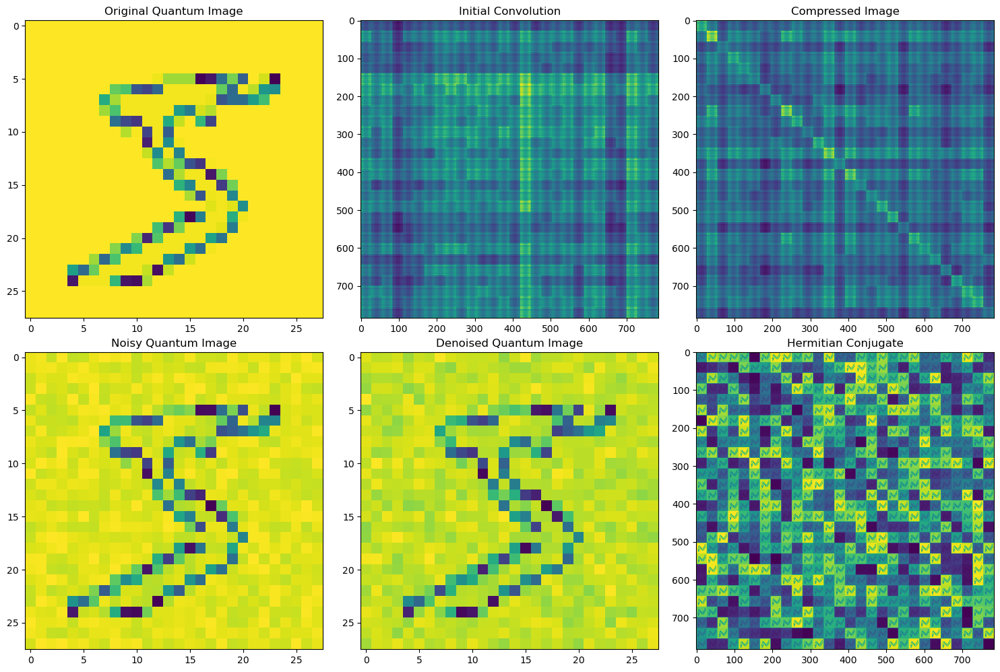

In [25]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Define functions for quantum operations
def initial_convolution(q_p, q_ki):
    c_ij = np.random.rand(q_ki.shape[0], q_ki.shape[1])  # Random complex coefficients for kernel elements
    d_kl = np.random.rand(q_p.shape[0], q_p.shape[1])    # Random complex coefficients for quantum image pixels
    Qc = np.kron(c_ij, q_p) @ np.kron(d_kl, q_p)
    return Qc

def quantum_image_compression(q_i, U):
    U_dagger = np.conjugate(U.T)
    q_compressed = np.kron(U, q_i) @ np.kron(U_dagger, q_i)
    return q_compressed

def quantum_image_denoising(q_noisy_image, q_n, F_inv, F):
    q_denoised = F_inv @ (F @ (q_noisy_image - q_n))
    return q_denoised

def hermitian_conjugate(Qc, q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    Qc_dagger = np.kron(q_ki_dagger, q_p).T
    return Qc_dagger

def tensor_associative_property(q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    result = np.kron(q_ki, q_p) @ np.kron(q_ki_dagger, np.eye(q_p.shape[0]))
    return result

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Define a sample quantum kernel
q_ki = np.random.rand(28, 28)

# Initial convolution
initial_conv = initial_convolution(q_image, q_ki)

# Quantum image compression
U = np.random.rand(28, 28)
compressed_image = quantum_image_compression(q_image, U)

# Quantum image denoising
F = np.random.rand(28, 28)
F_inv = np.linalg.inv(F)
q_noisy_image = q_image + 0.1 * np.random.rand(28, 28)  # Adding some noise
q_n = 0.1 * np.random.rand(28, 28)  # Noise
denoised_image = quantum_image_denoising(q_noisy_image, q_n, F_inv, F)

# Hermitian conjugate
Qc_dagger = hermitian_conjugate(initial_conv, q_ki, q_image)

# Associative property of the tensor product
associative_result = tensor_associative_property(q_ki, q_image)

# Plotting the results
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Original Quantum Image
axs[0, 0].imshow(q_image, cmap='viridis')
axs[0, 0].set_title('Original Quantum Image')

# Initial Convolution
axs[0, 1].imshow(np.abs(initial_conv), cmap='viridis')
axs[0, 1].set_title('Initial Convolution')

# Compressed Image
axs[0, 2].imshow(np.abs(compressed_image), cmap='viridis')
axs[0, 2].set_title('Compressed Image')

# Noisy Quantum Image
axs[1, 0].imshow(np.abs(q_noisy_image), cmap='viridis')
axs[1, 0].set_title('Noisy Quantum Image')

# Denoised Quantum Image
axs[1, 1].imshow(np.abs(denoised_image), cmap='viridis')
axs[1, 1].set_title('Denoised Quantum Image')

# Hermitian Conjugate Result
axs[1, 2].imshow(np.abs(Qc_dagger), cmap='viridis')
axs[1, 2].set_title('Hermitian Conjugate')

plt.tight_layout()
plt.show()


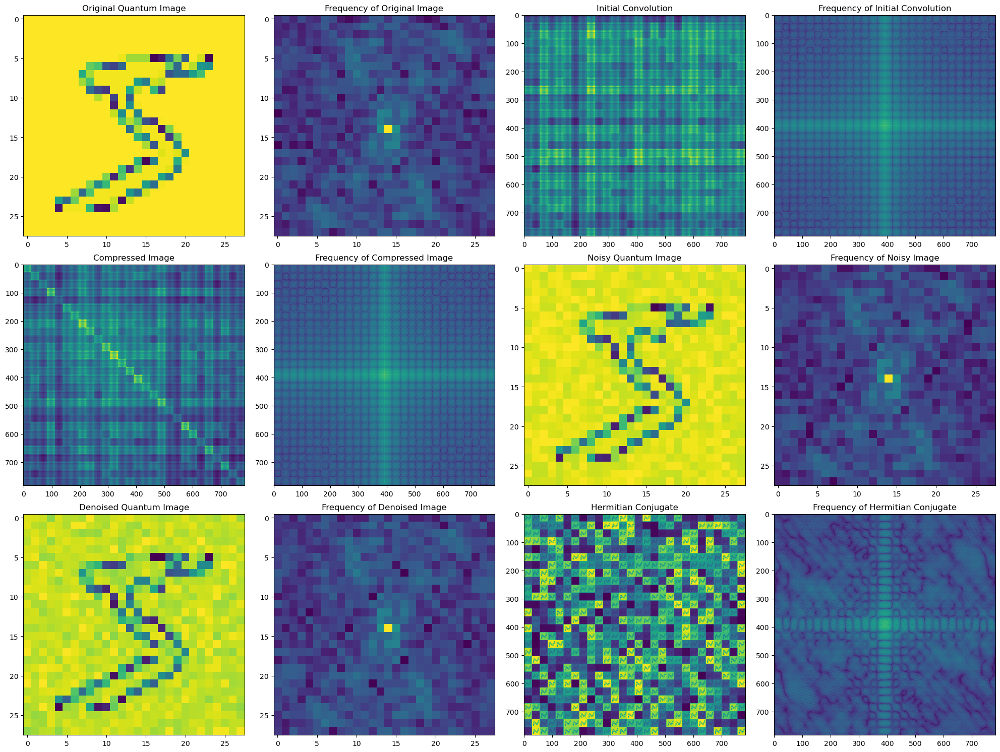

In [30]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms

# Define functions for quantum operations
def initial_convolution(q_p, q_ki):
    c_ij = np.random.rand(q_ki.shape[0], q_ki.shape[1])  # Random complex coefficients for kernel elements
    d_kl = np.random.rand(q_p.shape[0], q_p.shape[1])    # Random complex coefficients for quantum image pixels
    Qc = np.kron(c_ij, q_p) @ np.kron(d_kl, q_p)
    return Qc

def quantum_image_compression(q_i, U):
    U_dagger = np.conjugate(U.T)
    q_compressed = np.kron(U, q_i) @ np.kron(U_dagger, q_i)
    return q_compressed

def quantum_image_denoising(q_noisy_image, q_n, F_inv, F):
    q_denoised = F_inv @ (F @ (q_noisy_image - q_n))
    return q_denoised

def hermitian_conjugate(Qc, q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    Qc_dagger = np.kron(q_ki_dagger, q_p).T
    return Qc_dagger

def tensor_associative_property(q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    result = np.kron(q_ki, q_p) @ np.kron(q_ki_dagger, np.eye(q_p.shape[0]))
    return result

# Perform Fourier Transform
def fourier_transform(image):
    return np.fft.fftshift(np.fft.fft2(image))

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Define a sample quantum kernel
q_ki = np.random.rand(28, 28)

# Initial convolution
initial_conv = initial_convolution(q_image, q_ki)

# Quantum image compression
U = np.random.rand(28, 28)
compressed_image = quantum_image_compression(q_image, U)

# Quantum image denoising
F = np.random.rand(28, 28)
F_inv = np.linalg.inv(F)
q_noisy_image = q_image + 0.1 * np.random.rand(28, 28)  # Adding some noise
q_n = 0.1 * np.random.rand(28, 28)  # Noise
denoised_image = quantum_image_denoising(q_noisy_image, q_n, F_inv, F)

# Hermitian conjugate
Qc_dagger = hermitian_conjugate(initial_conv, q_ki, q_image)

# Associative property of the tensor product
associative_result = tensor_associative_property(q_ki, q_image)

# Perform Fourier Transform for frequency graphs
original_freq = np.log(np.abs(fourier_transform(q_image)) + 1)
initial_conv_freq = np.log(np.abs(fourier_transform(initial_conv)) + 1)
compressed_freq = np.log(np.abs(fourier_transform(compressed_image)) + 1)
noisy_freq = np.log(np.abs(fourier_transform(q_noisy_image)) + 1)
denoised_freq = np.log(np.abs(fourier_transform(denoised_image)) + 1)
hermitian_conj_freq = np.log(np.abs(fourier_transform(Qc_dagger)) + 1)

# Plotting the results
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

# Original Quantum Image
axs[0, 0].imshow(q_image, cmap='viridis')
axs[0, 0].set_title('Original Quantum Image')
axs[0, 1].imshow(original_freq, cmap='viridis')
axs[0, 1].set_title('Frequency of Original Image')

# Initial Convolution
axs[0, 2].imshow(np.abs(initial_conv), cmap='viridis')
axs[0, 2].set_title('Initial Convolution')
axs[0, 3].imshow(initial_conv_freq, cmap='viridis')
axs[0, 3].set_title('Frequency of Initial Convolution')

# Compressed Image
axs[1, 0].imshow(np.abs(compressed_image), cmap='viridis')
axs[1, 0].set_title('Compressed Image')
axs[1, 1].imshow(compressed_freq, cmap='viridis')
axs[1, 1].set_title('Frequency of Compressed Image')

# Noisy Quantum Image
axs[1, 2].imshow(np.abs(q_noisy_image), cmap='viridis')
axs[1, 2].set_title('Noisy Quantum Image')
axs[1, 3].imshow(noisy_freq, cmap='viridis')
axs[1, 3].set_title('Frequency of Noisy Image')

# Denoised Quantum Image
axs[2, 0].imshow(np.abs(denoised_image), cmap='viridis')
axs[2, 0].set_title('Denoised Quantum Image')
axs[2, 1].imshow(denoised_freq, cmap='viridis')
axs[2, 1].set_title('Frequency of Denoised Image')

# Hermitian Conjugate Result
axs[2, 2].imshow(np.abs(Qc_dagger), cmap='viridis')
axs[2, 2].set_title('Hermitian Conjugate')
axs[2, 3].imshow(hermitian_conj_freq, cmap='viridis')
axs[2, 3].set_title('Frequency of Hermitian Conjugate')

plt.tight_layout()
plt.savefig("b2.svg", format="svg")
plt.show()


In [45]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
import torch

# Define functions for quantum operations
def initial_convolution(q_p, q_ki):
    c_ij = np.random.rand(q_ki.shape[0], q_ki.shape[1])  # Random complex coefficients for kernel elements
    d_kl = np.random.rand(q_p.shape[0], q_p.shape[1])    # Random complex coefficients for quantum image pixels
    Qc = np.kron(c_ij, q_p) @ np.kron(d_kl, q_p)
    return Qc

def quantum_image_compression(q_i, U):
    U_dagger = np.conjugate(U.T)
    q_compressed = np.kron(U, q_i) @ np.kron(U_dagger, q_i)
    return q_compressed

def quantum_image_denoising(q_noisy_image, q_n, F_inv, F):
    q_denoised = F_inv @ (F @ (q_noisy_image - q_n))
    return q_denoised

def hermitian_conjugate(Qc, q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    Qc_dagger = np.kron(q_ki_dagger, q_p).T
    return Qc_dagger

def tensor_associative_property(q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    result = np.kron(q_ki, q_p) @ np.kron(q_ki_dagger, np.eye(q_p.shape[0]))
    return result

# Perform Fourier Transform
def fourier_transform(image):
    return np.fft.fftshift(np.fft.fft2(image))

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
mnist_image, _ = trainset[0]
mnist_image = np.abs(mnist_image.numpy()[0])


# Load Lenna image using forward slashes
lenna_image = Image.open('C:/Users/ACER/Desktop/lena_256.jpg').convert('L')


lenna_image = np.array(lenna_image)
lenna_image = lenna_image / 255.0  # Normalize to [0, 1]

# Define a sample quantum kernel
q_ki = np.random.rand(lenna_image.shape[0], lenna_image.shape[1])

# Initial convolution on MNIST image
initial_conv_mnist = initial_convolution(mnist_image, q_ki)

# Quantum image compression on MNIST image
U = np.random.rand(mnist_image.shape[0], mnist_image.shape[1])
compressed_image_mnist = quantum_image_compression(mnist_image, U)

# Quantum image denoising on MNIST image
F = np.random.rand(mnist_image.shape[0], mnist_image.shape[1])
F_inv = np.linalg.inv(F)
q_noisy_image_mnist = mnist_image + 0.1 * np.random.rand(mnist_image.shape[0], mnist_image.shape[1])  # Adding some noise
q_n_mnist = 0.1 * np.random.rand(mnist_image.shape[0], mnist_image.shape[1])  # Noise
denoised_image_mnist = quantum_image_denoising(q_noisy_image_mnist, q_n_mnist, F_inv, F)

# Hermitian conjugate on MNIST image
Qc_dagger_mnist = hermitian_conjugate(initial_conv_mnist, q_ki, mnist_image)

# Associative property of the tensor product on MNIST image
associative_result_mnist = tensor_associative_property(q_ki, mnist_image)

# Initial convolution on Lenna image
initial_conv_lenna = initial_convolution(lenna_image, q_ki)

# Quantum image compression on Lenna image
compressed_image_lenna = quantum_image_compression(lenna_image, U)

# Quantum image denoising on Lenna image
q_noisy_image_lenna = lenna_image + 0.1 * np.random.rand(lenna_image.shape[0], lenna_image.shape[1])  # Adding some noise
q_n_lenna = 0.1 * np.random.rand(lenna_image.shape[0], lenna_image.shape[1])  # Noise
denoised_image_lenna = quantum_image_denoising(q_noisy_image_lenna, q_n_lenna, F_inv, F)

# Hermitian conjugate on Lenna image
Qc_dagger_lenna = hermitian_conjugate(initial_conv_lenna, q_ki, lenna_image)

# Associative property of the tensor product on Lenna image
associative_result_lenna = tensor_associative_property(q_ki, lenna_image)

# Perform Fourier Transform for frequency graphs
mnist_freq = np.log(np.abs(fourier_transform(mnist_image)) + 1)
initial_conv_mnist_freq = np.log(np.abs(fourier_transform(initial_conv_mnist)) + 1)
compressed_freq_mnist = np.log(np.abs(fourier_transform(compressed_image_mnist)) + 1)
noisy_freq_mnist = np.log(np.abs(fourier_transform(q_noisy_image_mnist)) + 1)
denoised_freq_mnist = np.log(np.abs(fourier_transform(denoised_image_mnist)) + 1)
hermitian_conj_freq_mnist = np.log(np.abs(fourier_transform(Qc_dagger_mnist)) + 1)

lenna_freq = np.log(np.abs(fourier_transform(lenna_image)) + 1)
initial_conv_lenna_freq = np.log(np.abs(fourier_transform(initial_conv_lenna)) + 1)
compressed_freq_lenna = np.log(np.abs(fourier_transform(compressed_image_lenna)) + 1)
noisy_freq_lenna = np.log(np.abs(fourier_transform(q_noisy_image_lenna)) + 1)
denoised_freq_lenna = np.log(np.abs(fourier_transform(denoised_image_lenna)) + 1)
hermitian_conj_freq_lenna = np.log(np.abs(fourier_transform(Qc_dagger_lenna)) + 1)

# Plotting the results
fig, axs = plt.subplots(6, 4, figsize=(20, 25))

# MNIST Images and Frequencies
axs[0, 0].imshow(mnist_image, cmap='gray')
axs[0, 0].set_title('Original MNIST Image')
axs[0, 1].imshow(mnist_freq, cmap='gray')
axs[0, 1].set_title('Frequency of MNIST Image')

axs[0, 2].imshow(np.abs(initial_conv_mnist), cmap='gray')
axs[0, 2].set_title('Initial Convolution (MNIST)')
axs[0, 3].imshow(initial_conv_mnist_freq, cmap='gray')
axs[0, 3].set_title('Frequency of Initial Convolution (MNIST)')

axs[1, 0].imshow(np.abs(compressed_image_mnist), cmap='gray')
axs[1, 0].set_title('Compressed MNIST Image')
axs[1, 1].imshow(compressed_freq_mnist, cmap='gray')
axs[1, 1].set_title('Frequency of Compressed MNIST Image')

axs[1, 2].imshow(np.abs(q_noisy_image_mnist), cmap='gray')
axs[1, 2].set_title('Noisy MNIST Image')
axs[1, 3].imshow(noisy_freq_mnist, cmap='gray')
axs[1, 3].set_title('Frequency of Noisy MNIST Image')

axs[2, 0].imshow(np.abs(denoised_image_mnist), cmap='gray')
axs[2, 0].set_title('Denoised MNIST Image')
axs[2, 1].imshow(denoised_freq_mnist, cmap='gray')
axs[2, 1].set_title('Frequency of Denoised MNIST Image')

axs[2, 2].imshow(np.abs(Qc_dagger_mnist), cmap='gray')
axs[2, 2].set_title('Hermitian Conjugate (MNIST)')
axs[2, 3].imshow(hermitian_conj_freq_mnist, cmap='gray')
axs[2, 3].set_title('Frequency of Hermitian Conjugate (MNIST)')

# Lenna Images and Frequencies
axs[3, 0].imshow(lenna_image, cmap='gray')
axs[3, 0].set_title('Original Lenna Image')
axs[3, 1].imshow(lenna_freq, cmap='gray')
axs[3, 1].set_title('Frequency of Lenna Image')

axs[3, 2].imshow(np.abs(initial_conv_lenna), cmap='gray')
axs[3, 2].set_title('Initial Convolution (Lenna)')
axs[3, 3].imshow(initial_conv_lenna_freq, cmap='gray')
axs[3, 3].set_title('Frequency of Initial Convolution (Lenna)')

axs[4, 0].imshow(np.abs(compressed_image_lenna), cmap='gray')
axs[4, 0].set_title('Compressed Lenna Image')
axs[4, 1].imshow(compressed_freq_lenna, cmap='gray')
axs[4, 1].set_title('Frequency of Compressed Lenna Image')

axs[4, 2].imshow(np.abs(q_noisy_image_lenna), cmap='gray')
axs[4, 2].set_title('Noisy Lenna Image')
axs[4, 3].imshow(noisy_freq_lenna, cmap='gray')
axs[4, 3].set_title('Frequency of Noisy Lenna Image')

axs[5, 0].imshow(np.abs(denoised_image_lenna), cmap='gray')
axs[5, 0].set_title('Denoised Lenna Image')
axs[5, 1].imshow(denoised_freq_lenna, cmap='gray')
axs[5, 1].set_title('Frequency of Denoised Lenna Image')

axs[5, 2].imshow(np.abs(Qc_dagger_lenna), cmap='gray')
axs[5, 2].set_title('Hermitian Conjugate (Lenna)')
axs[5, 3].imshow(hermitian_conj_freq_lenna, cmap='gray')
axs[5, 3].set_title('Frequency of Hermitian Conjugate (Lenna)')

plt.tight_layout()
plt.show()


ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 784 is different from 7168)


[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


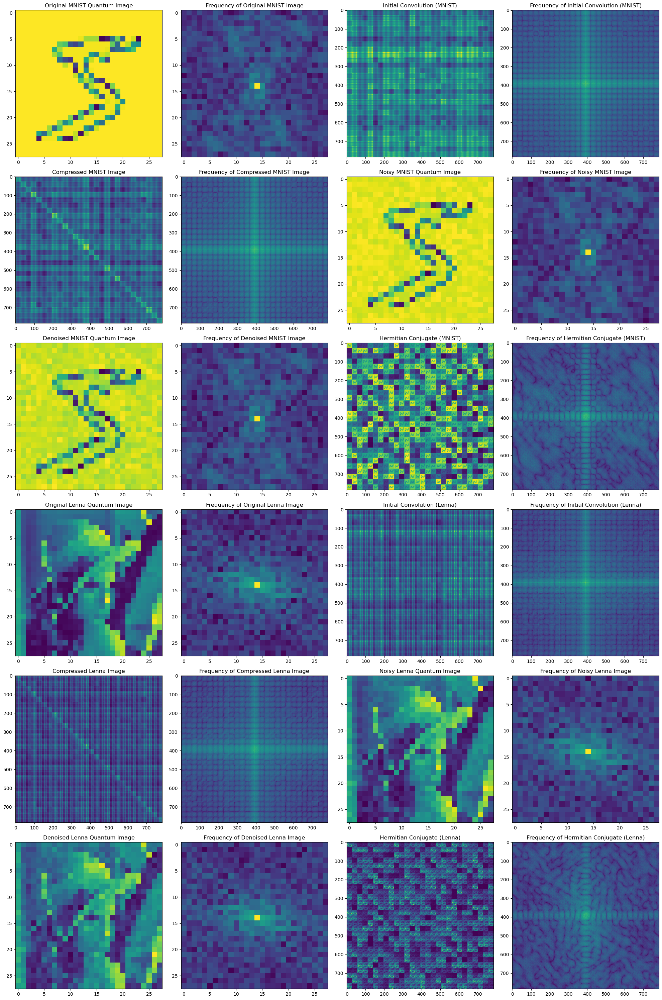

In [3]:
# Install OpenCV
!pip install opencv-python

# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
from PIL import Image
import cv2

# Define functions for quantum operations
def initial_convolution(q_p, q_ki):
    c_ij = np.random.rand(q_ki.shape[0], q_ki.shape[1])  # Random complex coefficients for kernel elements
    d_kl = np.random.rand(q_p.shape[0], q_p.shape[1])    # Random complex coefficients for quantum image pixels
    Qc = np.kron(c_ij, q_p) @ np.kron(d_kl, q_p)
    return Qc

def quantum_image_compression(q_i, U):
    U_dagger = np.conjugate(U.T)
    q_compressed = np.kron(U, q_i) @ np.kron(U_dagger, q_i)
    return q_compressed

def quantum_image_denoising(q_noisy_image, q_n, F_inv, F):
    q_denoised = F_inv @ (F @ (q_noisy_image - q_n))
    return q_denoised

def hermitian_conjugate(Qc, q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    Qc_dagger = np.kron(q_ki_dagger, q_p).T
    return Qc_dagger

def tensor_associative_property(q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    result = np.kron(q_ki, q_p) @ np.kron(q_ki_dagger, np.eye(q_p.shape[0]))
    return result

# Perform Fourier Transform
def fourier_transform(image):
    return np.fft.fftshift(np.fft.fft2(image))

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Load the Lenna image
lenna_image = cv2.imread('C:/Users/ACER/Desktop/lena_256.jpg', cv2.IMREAD_GRAYSCALE)
lenna_image = cv2.resize(lenna_image, (28, 28))
q_lenna_image = lenna_image / 255.0  # Normalize the image

# Define a sample quantum kernel
q_ki = np.random.rand(28, 28)

# Initial convolution for MNIST image
initial_conv_mnist = initial_convolution(q_image, q_ki)

# Initial convolution for Lenna image
initial_conv_lenna = initial_convolution(q_lenna_image, q_ki)

# Quantum image compression for MNIST image
U = np.random.rand(28, 28)
compressed_image_mnist = quantum_image_compression(q_image, U)

# Quantum image compression for Lenna image
compressed_image_lenna = quantum_image_compression(q_lenna_image, U)

# Quantum image denoising for MNIST image
F = np.random.rand(28, 28)
F_inv = np.linalg.inv(F)
q_noisy_image_mnist = q_image + 0.1 * np.random.rand(28, 28)  # Adding some noise
q_n = 0.1 * np.random.rand(28, 28)  # Noise
denoised_image_mnist = quantum_image_denoising(q_noisy_image_mnist, q_n, F_inv, F)

# Quantum image denoising for Lenna image
q_noisy_image_lenna = q_lenna_image + 0.1 * np.random.rand(28, 28)  # Adding some noise
denoised_image_lenna = quantum_image_denoising(q_noisy_image_lenna, q_n, F_inv, F)

# Hermitian conjugate for MNIST image
Qc_dagger_mnist = hermitian_conjugate(initial_conv_mnist, q_ki, q_image)

# Hermitian conjugate for Lenna image
Qc_dagger_lenna = hermitian_conjugate(initial_conv_lenna, q_ki, q_lenna_image)

# Associative property of the tensor product for MNIST image
associative_result_mnist = tensor_associative_property(q_ki, q_image)

# Associative property of the tensor product for Lenna image
associative_result_lenna = tensor_associative_property(q_ki, q_lenna_image)

# Perform Fourier Transform for frequency graphs
original_freq_mnist = np.log(np.abs(fourier_transform(q_image)) + 1)
initial_conv_freq_mnist = np.log(np.abs(fourier_transform(initial_conv_mnist)) + 1)
compressed_freq_mnist = np.log(np.abs(fourier_transform(compressed_image_mnist)) + 1)
noisy_freq_mnist = np.log(np.abs(fourier_transform(q_noisy_image_mnist)) + 1)
denoised_freq_mnist = np.log(np.abs(fourier_transform(denoised_image_mnist)) + 1)
hermitian_conj_freq_mnist = np.log(np.abs(fourier_transform(Qc_dagger_mnist)) + 1)

original_freq_lenna = np.log(np.abs(fourier_transform(q_lenna_image)) + 1)
initial_conv_freq_lenna = np.log(np.abs(fourier_transform(initial_conv_lenna)) + 1)
compressed_freq_lenna = np.log(np.abs(fourier_transform(compressed_image_lenna)) + 1)
noisy_freq_lenna = np.log(np.abs(fourier_transform(q_noisy_image_lenna)) + 1)
denoised_freq_lenna = np.log(np.abs(fourier_transform(denoised_image_lenna)) + 1)
hermitian_conj_freq_lenna = np.log(np.abs(fourier_transform(Qc_dagger_lenna)) + 1)

# Plotting the results
fig, axs = plt.subplots(6, 4, figsize=(20, 30))

# Original MNIST Quantum Image
axs[0, 0].imshow(q_image, cmap='viridis')
axs[0, 0].set_title('Original MNIST Quantum Image')
axs[0, 1].imshow(original_freq_mnist, cmap='viridis')
axs[0, 1].set_title('Frequency of Original MNIST Image')

# Initial Convolution for MNIST image
axs[0, 2].imshow(np.abs(initial_conv_mnist), cmap='viridis')
axs[0, 2].set_title('Initial Convolution (MNIST)')
axs[0, 3].imshow(initial_conv_freq_mnist, cmap='viridis')
axs[0, 3].set_title('Frequency of Initial Convolution (MNIST)')

# Compressed MNIST Image
axs[1, 0].imshow(np.abs(compressed_image_mnist), cmap='viridis')
axs[1, 0].set_title('Compressed MNIST Image')
axs[1, 1].imshow(compressed_freq_mnist, cmap='viridis')
axs[1, 1].set_title('Frequency of Compressed MNIST Image')

# Noisy MNIST Quantum Image
axs[1, 2].imshow(np.abs(q_noisy_image_mnist), cmap='viridis')
axs[1, 2].set_title('Noisy MNIST Quantum Image')
axs[1, 3].imshow(noisy_freq_mnist, cmap='viridis')
axs[1, 3].set_title('Frequency of Noisy MNIST Image')

# Denoised MNIST Quantum Image
axs[2, 0].imshow(np.abs(denoised_image_mnist), cmap='viridis')
axs[2, 0].set_title('Denoised MNIST Quantum Image')
axs[2, 1].imshow(denoised_freq_mnist, cmap='viridis')
axs[2, 1].set_title('Frequency of Denoised MNIST Image')

# Hermitian Conjugate for MNIST image
axs[2, 2].imshow(np.abs(Qc_dagger_mnist), cmap='viridis')
axs[2, 2].set_title('Hermitian Conjugate (MNIST)')
axs[2, 3].imshow(hermitian_conj_freq_mnist, cmap='viridis')
axs[2, 3].set_title('Frequency of Hermitian Conjugate (MNIST)')

# Original Lenna Quantum Image
axs[3, 0].imshow(q_lenna_image, cmap='viridis')
axs[3, 0].set_title('Original Lenna Quantum Image')
axs[3, 1].imshow(original_freq_lenna, cmap='viridis')
axs[3, 1].set_title('Frequency of Original Lenna Image')

# Initial Convolution for Lenna image
axs[3, 2].imshow(np.abs(initial_conv_lenna), cmap='viridis')
axs[3, 2].set_title('Initial Convolution (Lenna)')
axs[3, 3].imshow(initial_conv_freq_lenna, cmap='viridis')
axs[3, 3].set_title('Frequency of Initial Convolution (Lenna)')

# Compressed Lenna Image
axs[4, 0].imshow(np.abs(compressed_image_lenna), cmap='viridis')
axs[4, 0].set_title('Compressed Lenna Image')
axs[4, 1].imshow(compressed_freq_lenna, cmap='viridis')
axs[4, 1].set_title('Frequency of Compressed Lenna Image')

# Noisy Lenna Quantum Image
axs[4, 2].imshow(np.abs(q_noisy_image_lenna), cmap='viridis')
axs[4, 2].set_title('Noisy Lenna Quantum Image')
axs[4, 3].imshow(noisy_freq_lenna, cmap='viridis')
axs[4, 3].set_title('Frequency of Noisy Lenna Image')

# Denoised Lenna Quantum Image
axs[5, 0].imshow(np.abs(denoised_image_lenna), cmap='viridis')
axs[5, 0].set_title('Denoised Lenna Quantum Image')
axs[5, 1].imshow(denoised_freq_lenna, cmap='viridis')
axs[5, 1].set_title('Frequency of Denoised Lenna Image')

# Hermitian Conjugate for Lenna image
axs[5, 2].imshow(np.abs(Qc_dagger_lenna), cmap='viridis')
axs[5, 2].set_title('Hermitian Conjugate (Lenna)')
axs[5, 3].imshow(hermitian_conj_freq_lenna, cmap='viridis')
axs[5, 3].set_title('Frequency of Hermitian Conjugate (Lenna)')

plt.tight_layout()
plt.savefig("bbb1.svg", format="svg")
plt.show()



[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


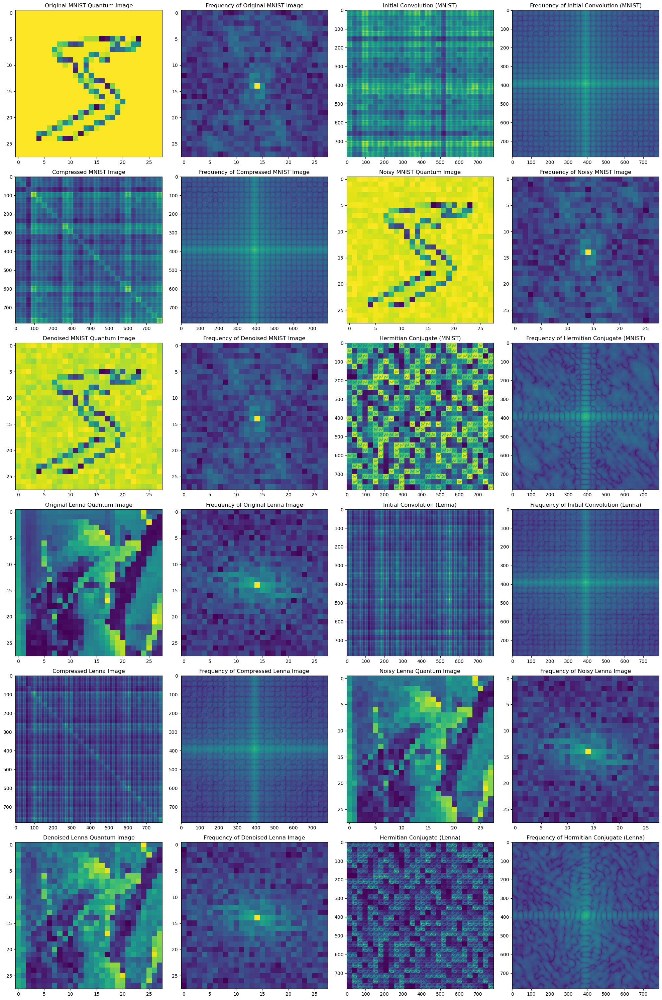

In [5]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
from PIL import Image
import cv2

# Install OpenCV if not already installed
!pip install opencv-python

# Define functions for quantum operations
def initial_convolution(q_p, q_ki):
    c_ij = np.random.rand(q_ki.shape[0], q_ki.shape[1])  # Random complex coefficients for kernel elements
    d_kl = np.random.rand(q_p.shape[0], q_p.shape[1])    # Random complex coefficients for quantum image pixels
    Qc = np.kron(c_ij, q_p) @ np.kron(d_kl, q_p)
    return Qc

def quantum_image_compression(q_i, U):
    U_dagger = np.conjugate(U.T)
    q_compressed = np.kron(U, q_i) @ np.kron(U_dagger, q_i)
    return q_compressed

def quantum_image_denoising(q_noisy_image, q_n, F_inv, F):
    q_denoised = F_inv @ (F @ (q_noisy_image - q_n))
    return q_denoised

def hermitian_conjugate(Qc, q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    Qc_dagger = np.kron(q_ki_dagger, q_p).T
    return Qc_dagger

def tensor_associative_property(q_ki, q_p):
    q_ki_dagger = np.conjugate(q_ki.T)
    result = np.kron(q_ki, q_p) @ np.kron(q_ki_dagger, np.eye(q_p.shape[0]))
    return result

# Perform Fourier Transform
def fourier_transform(image):
    return np.fft.fftshift(np.fft.fft2(image))

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Load the Lenna image
lenna_image = cv2.imread('C:/Users/ACER/Desktop/lena_256.jpg', cv2.IMREAD_GRAYSCALE)
lenna_image = cv2.resize(lenna_image, (28, 28))
q_lenna_image = lenna_image / 255.0  # Normalize the image

# Define a sample quantum kernel
q_ki = np.random.rand(28, 28)

# Initial convolution for MNIST image
initial_conv_mnist = initial_convolution(q_image, q_ki)

# Initial convolution for Lenna image
initial_conv_lenna = initial_convolution(q_lenna_image, q_ki)

# Quantum image compression for MNIST image
U = np.random.rand(28, 28)
compressed_image_mnist = quantum_image_compression(q_image, U)

# Quantum image compression for Lenna image
compressed_image_lenna = quantum_image_compression(q_lenna_image, U)

# Quantum image denoising for MNIST image
F = np.random.rand(28, 28)
F_inv = np.linalg.inv(F)
q_noisy_image_mnist = q_image + 0.1 * np.random.rand(28, 28)  # Adding some noise
q_n = 0.1 * np.random.rand(28, 28)  # Noise
denoised_image_mnist = quantum_image_denoising(q_noisy_image_mnist, q_n, F_inv, F)

# Quantum image denoising for Lenna image
q_noisy_image_lenna = q_lenna_image + 0.1 * np.random.rand(28, 28)  # Adding some noise
denoised_image_lenna = quantum_image_denoising(q_noisy_image_lenna, q_n, F_inv, F)

# Hermitian conjugate for MNIST image
Qc_dagger_mnist = hermitian_conjugate(initial_conv_mnist, q_ki, q_image)

# Hermitian conjugate for Lenna image
Qc_dagger_lenna = hermitian_conjugate(initial_conv_lenna, q_ki, q_lenna_image)

# Associative property of the tensor product for MNIST image
associative_result_mnist = tensor_associative_property(q_ki, q_image)

# Associative property of the tensor product for Lenna image
associative_result_lenna = tensor_associative_property(q_ki, q_lenna_image)

# Perform Fourier Transform for frequency graphs
original_freq_mnist = np.log(np.abs(fourier_transform(q_image)) + 1)
initial_conv_freq_mnist = np.log(np.abs(fourier_transform(initial_conv_mnist)) + 1)
compressed_freq_mnist = np.log(np.abs(fourier_transform(compressed_image_mnist)) + 1)
noisy_freq_mnist = np.log(np.abs(fourier_transform(q_noisy_image_mnist)) + 1)
denoised_freq_mnist = np.log(np.abs(fourier_transform(denoised_image_mnist)) + 1)
hermitian_conj_freq_mnist = np.log(np.abs(fourier_transform(Qc_dagger_mnist)) + 1)

original_freq_lenna = np.log(np.abs(fourier_transform(q_lenna_image)) + 1)
initial_conv_freq_lenna = np.log(np.abs(fourier_transform(initial_conv_lenna)) + 1)
compressed_freq_lenna = np.log(np.abs(fourier_transform(compressed_image_lenna)) + 1)
noisy_freq_lenna = np.log(np.abs(fourier_transform(q_noisy_image_lenna)) + 1)
denoised_freq_lenna = np.log(np.abs(fourier_transform(denoised_image_lenna)) + 1)
hermitian_conj_freq_lenna = np.log(np.abs(fourier_transform(Qc_dagger_lenna)) + 1)

# Plotting the results
fig, axs = plt.subplots(6, 4, figsize=(20, 30))

# Original MNIST Quantum Image
axs[0, 0].imshow(q_image, cmap='viridis')
axs[0, 0].set_title('Original MNIST Quantum Image')
axs[0, 1].imshow(original_freq_mnist, cmap='viridis')
axs[0, 1].set_title('Frequency of Original MNIST Image')

# Initial Convolution for MNIST image
axs[0, 2].imshow(np.abs(initial_conv_mnist), cmap='viridis')
axs[0, 2].set_title('Initial Convolution (MNIST)')
axs[0, 3].imshow(initial_conv_freq_mnist, cmap='viridis')
axs[0, 3].set_title('Frequency of Initial Convolution (MNIST)')

# Compressed MNIST Image
axs[1, 0].imshow(np.abs(compressed_image_mnist), cmap='viridis')
axs[1, 0].set_title('Compressed MNIST Image')
axs[1, 1].imshow(compressed_freq_mnist, cmap='viridis')
axs[1, 1].set_title('Frequency of Compressed MNIST Image')

# Noisy MNIST Quantum Image
axs[1, 2].imshow(np.abs(q_noisy_image_mnist), cmap='viridis')
axs[1, 2].set_title('Noisy MNIST Quantum Image')
axs[1, 3].imshow(noisy_freq_mnist, cmap='viridis')
axs[1, 3].set_title('Frequency of Noisy MNIST Image')

# Denoised MNIST Quantum Image
axs[2, 0].imshow(np.abs(denoised_image_mnist), cmap='viridis')
axs[2, 0].set_title('Denoised MNIST Quantum Image')
axs[2, 1].imshow(denoised_freq_mnist, cmap='viridis')
axs[2, 1].set_title('Frequency of Denoised MNIST Image')

# Hermitian Conjugate for MNIST image
axs[2, 2].imshow(np.abs(Qc_dagger_mnist), cmap='viridis')
axs[2, 2].set_title('Hermitian Conjugate (MNIST)')
axs[2, 3].imshow(hermitian_conj_freq_mnist, cmap='viridis')
axs[2, 3].set_title('Frequency of Hermitian Conjugate (MNIST)')

# Original Lenna Quantum Image
axs[3, 0].imshow(q_lenna_image, cmap='viridis')
axs[3, 0].set_title('Original Lenna Quantum Image')
axs[3, 1].imshow(original_freq_lenna, cmap='viridis')
axs[3, 1].set_title('Frequency of Original Lenna Image')

# Initial Convolution for Lenna image
axs[3, 2].imshow(np.abs(initial_conv_lenna), cmap='viridis')
axs[3, 2].set_title('Initial Convolution (Lenna)')
axs[3, 3].imshow(initial_conv_freq_lenna, cmap='viridis')
axs[3, 3].set_title('Frequency of Initial Convolution (Lenna)')

# Compressed Lenna Image
axs[4, 0].imshow(np.abs(compressed_image_lenna), cmap='viridis')
axs[4, 0].set_title('Compressed Lenna Image')
axs[4, 1].imshow(compressed_freq_lenna, cmap='viridis')
axs[4, 1].set_title('Frequency of Compressed Lenna Image')

# Noisy Lenna Quantum Image
axs[4, 2].imshow(np.abs(q_noisy_image_lenna), cmap='viridis')
axs[4, 2].set_title('Noisy Lenna Quantum Image')
axs[4, 3].imshow(noisy_freq_lenna, cmap='viridis')
axs[4, 3].set_title('Frequency of Noisy Lenna Image')

# Denoised Lenna Quantum Image
axs[5, 0].imshow(np.abs(denoised_image_lenna), cmap='viridis')
axs[5, 0].set_title('Denoised Lenna Quantum Image')
axs[5, 1].imshow(denoised_freq_lenna, cmap='viridis')
axs[5, 1].set_title('Frequency of Denoised Lenna Image')

# Hermitian Conjugate for Lenna image
axs[5, 2].imshow(np.abs(Qc_dagger_lenna), cmap='viridis')
axs[5, 2].set_title('Hermitian Conjugate (Lenna)')
axs[5, 3].imshow(hermitian_conj_freq_lenna, cmap='viridis')
axs[5, 3].set_title('Frequency of Hermitian Conjugate (Lenna)')

plt.tight_layout()
plt.show()


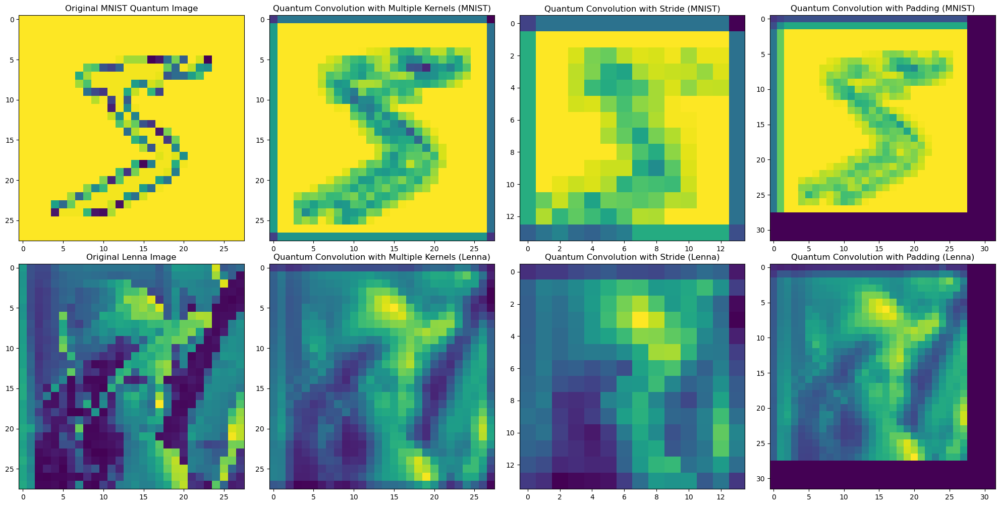

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
from PIL import Image
import cv2

def quantum_convolution(q_i, q_kernels, alpha, beta):
    n = len(q_kernels)
    Qc_sum = np.zeros_like(q_i, dtype=np.complex128)
    for m in range(n):
        kernel = q_kernels[m]
        alpha_m = alpha[m]
        beta_m = beta[m]
        kernel_size = kernel.shape
        padded_image = np.pad(q_i, [(kernel_size[0]//2, kernel_size[0]//2), (kernel_size[1]//2, kernel_size[1]//2)], mode='constant')
        conv_result = np.zeros_like(q_i, dtype=np.complex128)
        for i in range(q_i.shape[0]):
            for j in range(q_i.shape[1]):
                conv_result[i, j] = np.sum(
                    padded_image[i:i+kernel_size[0], j:j+kernel_size[1]] * kernel
                )
        Qc_sum += alpha_m * beta_m * conv_result
    return Qc_sum

def quantum_convolution_stride(q_i, q_k, stride):
    q_i_stride = q_i[::stride, ::stride]
    kernel_size = q_k.shape[0]
    padded_image = np.pad(q_i_stride, [(kernel_size//2, kernel_size//2), (kernel_size//2, kernel_size//2)], mode='constant')
    Qc_stride = np.zeros_like(q_i_stride, dtype=np.complex128)
    for i in range(q_i_stride.shape[0]):
        for j in range(q_i_stride.shape[1]):
            Qc_stride[i, j] = np.sum(
                padded_image[i:i+kernel_size, j:j+kernel_size] * q_k
            )
    return Qc_stride

def pad_image(q_i, pad_width):
    return np.pad(q_i, pad_width, mode='constant')

def quantum_convolution_pad(q_i, q_k, pad_width):
    q_i_padded = pad_image(q_i, ((pad_width, pad_width), (pad_width, pad_width)))
    kernel_size = q_k.shape[0]
    Qc_pad = np.zeros_like(q_i_padded, dtype=np.complex128)
    for i in range(q_i.shape[0]):
        for j in range(q_i.shape[1]):
            Qc_pad[i, j] = np.sum(
                q_i_padded[i:i+kernel_size, j:j+kernel_size] * q_k
            )
    return Qc_pad

def batch_norm(q_i, epsilon=1e-5):
    mu = np.mean(q_i)
    sigma2 = np.var(q_i)
    q_bn = (q_i - mu) / np.sqrt(sigma2 + epsilon)
    return q_bn

def quantum_convolution_bn(q_i, q_k, stride, pool_size):
    q_i_bn = batch_norm(q_i)
    q_i_pooled = q_i_bn[:pool_size, :pool_size]
    Qc_bn_pool = quantum_convolution_stride(q_i_pooled, q_k, stride)
    return Qc_bn_pool

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

lenna_image = cv2.imread('C:/Users/ACER/Desktop/lena_256.jpg', cv2.IMREAD_GRAYSCALE)
lenna_image = cv2.resize(lenna_image, (28, 28))
q_lenna_image = lenna_image / 255.0

q_kernels = [np.random.rand(3, 3) for _ in range(3)]
alpha = [np.random.rand() + 1j * np.random.rand() for _ in range(3)]
beta = [np.random.rand() + 1j * np.random.rand() for _ in range(3)]

qc_mnist = quantum_convolution(q_image, q_kernels, alpha, beta)
qc_stride_mnist = quantum_convolution_stride(q_image, q_kernels[0], stride=2)
qc_pad_mnist = quantum_convolution_pad(q_image, q_kernels[0], pad_width=2)
qc_bn_pool_mnist = quantum_convolution_bn(q_image, q_kernels[0], stride=2, pool_size=14)

qc_lenna = quantum_convolution(q_lenna_image, q_kernels, alpha, beta)
qc_stride_lenna = quantum_convolution_stride(q_lenna_image, q_kernels[0], stride=2)
qc_pad_lenna = quantum_convolution_pad(q_lenna_image, q_kernels[0], pad_width=2)
qc_bn_pool_lenna = quantum_convolution_bn(q_lenna_image, q_kernels[0], stride=2, pool_size=14)

fig, axs = plt.subplots(2, 4, figsize=(20, 10))

axs[0, 0].imshow(q_image, cmap='viridis')
axs[0, 0].set_title('Original MNIST Quantum Image')
axs[0, 1].imshow(np.abs(qc_mnist), cmap='viridis')
axs[0, 1].set_title('Quantum Convolution with Multiple Kernels (MNIST)')
axs[0, 2].imshow(np.abs(qc_stride_mnist), cmap='viridis')
axs[0, 2].set_title('Quantum Convolution with Stride (MNIST)')
axs[0, 3].imshow(np.abs(qc_pad_mnist), cmap='viridis')
axs[0, 3].set_title('Quantum Convolution with Padding (MNIST)')

axs[1, 0].imshow(q_lenna_image, cmap='viridis')
axs[1, 0].set_title('Original Lenna Image')
axs[1, 1].imshow(np.abs(qc_lenna), cmap='viridis')
axs[1, 1].set_title('Quantum Convolution with Multiple Kernels (Lenna)')
axs[1, 2].imshow(np.abs(qc_stride_lenna), cmap='viridis')
axs[1, 2].set_title('Quantum Convolution with Stride (Lenna)')
axs[1, 3].imshow(np.abs(qc_pad_lenna), cmap='viridis')
axs[1, 3].set_title('Quantum Convolution with Padding (Lenna)')

plt.tight_layout()
plt.savefig("bbb2.svg")
plt.show()


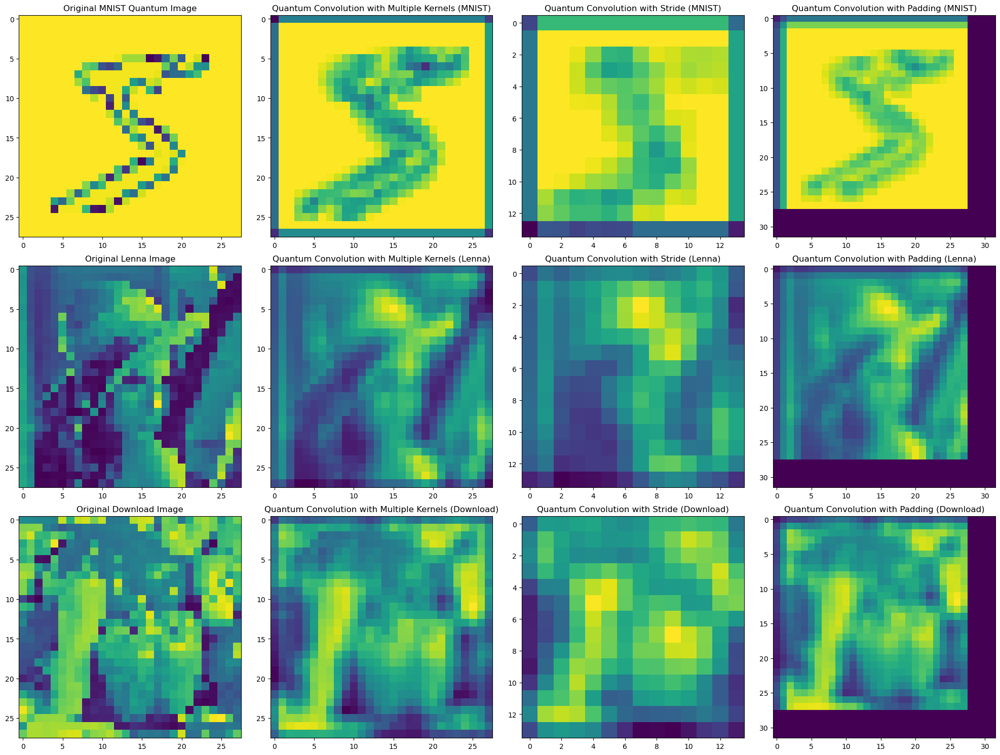

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
from PIL import Image
import cv2

def quantum_convolution(q_i, q_kernels, alpha, beta):
    n = len(q_kernels)
    Qc_sum = np.zeros_like(q_i, dtype=np.complex128)
    for m in range(n):
        kernel = q_kernels[m]
        alpha_m = alpha[m]
        beta_m = beta[m]
        kernel_size = kernel.shape
        padded_image = np.pad(q_i, [(kernel_size[0]//2, kernel_size[0]//2), (kernel_size[1]//2, kernel_size[1]//2)], mode='constant')
        conv_result = np.zeros_like(q_i, dtype=np.complex128)
        for i in range(q_i.shape[0]):
            for j in range(q_i.shape[1]):
                conv_result[i, j] = np.sum(
                    padded_image[i:i+kernel_size[0], j:j+kernel_size[1]] * kernel
                )
        Qc_sum += alpha_m * beta_m * conv_result
    return Qc_sum

def quantum_convolution_stride(q_i, q_k, stride):
    q_i_stride = q_i[::stride, ::stride]
    kernel_size = q_k.shape[0]
    padded_image = np.pad(q_i_stride, [(kernel_size//2, kernel_size//2), (kernel_size//2, kernel_size//2)], mode='constant')
    Qc_stride = np.zeros_like(q_i_stride, dtype=np.complex128)
    for i in range(q_i_stride.shape[0]):
        for j in range(q_i_stride.shape[1]):
            Qc_stride[i, j] = np.sum(
                padded_image[i:i+kernel_size, j:j+kernel_size] * q_k
            )
    return Qc_stride

def pad_image(q_i, pad_width):
    return np.pad(q_i, pad_width, mode='constant')

def quantum_convolution_pad(q_i, q_k, pad_width):
    q_i_padded = pad_image(q_i, ((pad_width, pad_width), (pad_width, pad_width)))
    kernel_size = q_k.shape[0]
    Qc_pad = np.zeros_like(q_i_padded, dtype=np.complex128)
    for i in range(q_i.shape[0]):
        for j in range(q_i.shape[1]):
            Qc_pad[i, j] = np.sum(
                q_i_padded[i:i+kernel_size, j:j+kernel_size] * q_k
            )
    return Qc_pad

def batch_norm(q_i, epsilon=1e-5):
    mu = np.mean(q_i)
    sigma2 = np.var(q_i)
    q_bn = (q_i - mu) / np.sqrt(sigma2 + epsilon)
    return q_bn

def quantum_convolution_bn(q_i, q_k, stride, pool_size):
    q_i_bn = batch_norm(q_i)
    q_i_pooled = q_i_bn[:pool_size, :pool_size]
    Qc_bn_pool = quantum_convolution_stride(q_i_pooled, q_k, stride)
    return Qc_bn_pool

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

lenna_image = cv2.imread('C:/Users/ACER/Desktop/lena_256.jpg', cv2.IMREAD_GRAYSCALE)
lenna_image = cv2.resize(lenna_image, (28, 28))
q_lenna_image = lenna_image / 255.0

download_image = cv2.imread('C:/Users/ACER/Desktop/download.jpg', cv2.IMREAD_GRAYSCALE)
download_image = cv2.resize(download_image, (28, 28))
q_download_image = download_image / 255.0

q_kernels = [np.random.rand(3, 3) for _ in range(3)]
alpha = [np.random.rand() + 1j * np.random.rand() for _ in range(3)]
beta = [np.random.rand() + 1j * np.random.rand() for _ in range(3)]

qc_mnist = quantum_convolution(q_image, q_kernels, alpha, beta)
qc_stride_mnist = quantum_convolution_stride(q_image, q_kernels[0], stride=2)
qc_pad_mnist = quantum_convolution_pad(q_image, q_kernels[0], pad_width=2)
qc_bn_pool_mnist = quantum_convolution_bn(q_image, q_kernels[0], stride=2, pool_size=14)

qc_lenna = quantum_convolution(q_lenna_image, q_kernels, alpha, beta)
qc_stride_lenna = quantum_convolution_stride(q_lenna_image, q_kernels[0], stride=2)
qc_pad_lenna = quantum_convolution_pad(q_lenna_image, q_kernels[0], pad_width=2)
qc_bn_pool_lenna = quantum_convolution_bn(q_lenna_image, q_kernels[0], stride=2, pool_size=14)

qc_download = quantum_convolution(q_download_image, q_kernels, alpha, beta)
qc_stride_download = quantum_convolution_stride(q_download_image, q_kernels[0], stride=2)
qc_pad_download = quantum_convolution_pad(q_download_image, q_kernels[0], pad_width=2)
qc_bn_pool_download = quantum_convolution_bn(q_download_image, q_kernels[0], stride=2, pool_size=14)

fig, axs = plt.subplots(3, 4, figsize=(20, 15))

axs[0, 0].imshow(q_image, cmap='viridis')
axs[0, 0].set_title('Original MNIST Quantum Image')
axs[0, 1].imshow(np.abs(qc_mnist), cmap='viridis')
axs[0, 1].set_title('Quantum Convolution with Multiple Kernels (MNIST)')
axs[0, 2].imshow(np.abs(qc_stride_mnist), cmap='viridis')
axs[0, 2].set_title('Quantum Convolution with Stride (MNIST)')
axs[0, 3].imshow(np.abs(qc_pad_mnist), cmap='viridis')
axs[0, 3].set_title('Quantum Convolution with Padding (MNIST)')

axs[1, 0].imshow(q_lenna_image, cmap='viridis')
axs[1, 0].set_title('Original Lenna Image')
axs[1, 1].imshow(np.abs(qc_lenna), cmap='viridis')
axs[1, 1].set_title('Quantum Convolution with Multiple Kernels (Lenna)')
axs[1, 2].imshow(np.abs(qc_stride_lenna), cmap='viridis')
axs[1, 2].set_title('Quantum Convolution with Stride (Lenna)')
axs[1, 3].imshow(np.abs(qc_pad_lenna), cmap='viridis')
axs[1, 3].set_title('Quantum Convolution with Padding (Lenna)')

axs[2, 0].imshow(q_download_image, cmap='viridis')
axs[2, 0].set_title('Original Download Image')
axs[2, 1].imshow(np.abs(qc_download), cmap='viridis')
axs[2, 1].set_title('Quantum Convolution with Multiple Kernels (Download)')
axs[2, 2].imshow(np.abs(qc_stride_download), cmap='viridis')
axs[2, 2].set_title('Quantum Convolution with Stride (Download)')
axs[2, 3].imshow(np.abs(qc_pad_download), cmap='viridis')
axs[2, 3].set_title('Quantum Convolution with Padding (Download)')

plt.tight_layout()
plt.show()


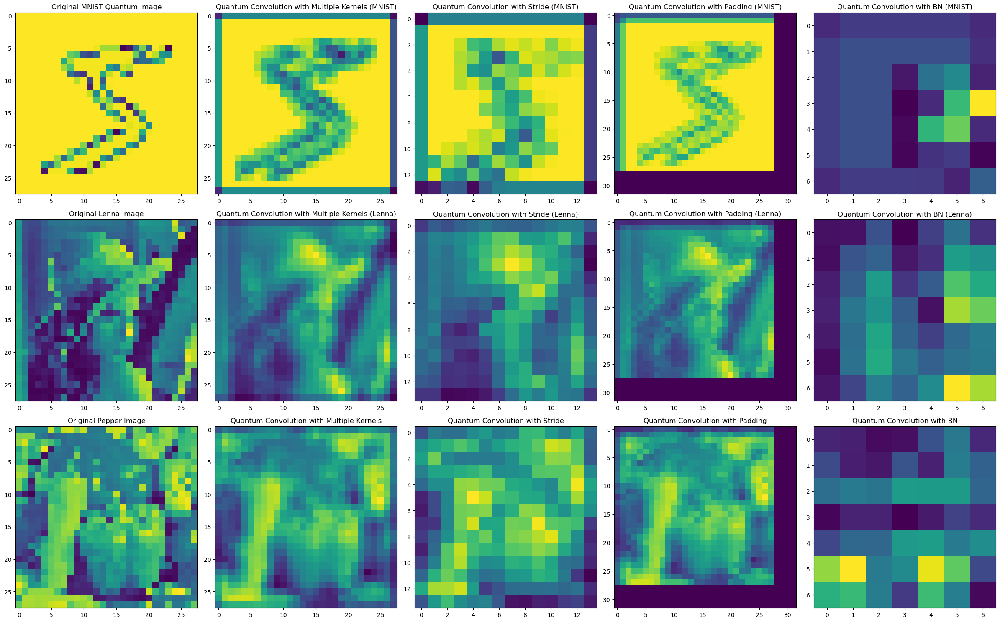

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
from PIL import Image
import cv2

def quantum_convolution(q_i, q_kernels, alpha, beta):
    n = len(q_kernels)
    Qc_sum = np.zeros_like(q_i, dtype=np.complex128)
    for m in range(n):
        kernel = q_kernels[m]
        alpha_m = alpha[m]
        beta_m = beta[m]
        kernel_size = kernel.shape
        padded_image = np.pad(q_i, [(kernel_size[0]//2, kernel_size[0]//2), (kernel_size[1]//2, kernel_size[1]//2)], mode='constant')
        conv_result = np.zeros_like(q_i, dtype=np.complex128)
        for i in range(q_i.shape[0]):
            for j in range(q_i.shape[1]):
                conv_result[i, j] = np.sum(
                    padded_image[i:i+kernel_size[0], j:j+kernel_size[1]] * kernel
                )
        Qc_sum += alpha_m * beta_m * conv_result
    return Qc_sum

def quantum_convolution_stride(q_i, q_k, stride):
    q_i_stride = q_i[::stride, ::stride]
    kernel_size = q_k.shape[0]
    padded_image = np.pad(q_i_stride, [(kernel_size//2, kernel_size//2), (kernel_size//2, kernel_size//2)], mode='constant')
    Qc_stride = np.zeros_like(q_i_stride, dtype=np.complex128)
    for i in range(q_i_stride.shape[0]):
        for j in range(q_i_stride.shape[1]):
            Qc_stride[i, j] = np.sum(
                padded_image[i:i+kernel_size, j:j+kernel_size] * q_k
            )
    return Qc_stride

def pad_image(q_i, pad_width):
    return np.pad(q_i, pad_width, mode='constant')

def quantum_convolution_pad(q_i, q_k, pad_width):
    q_i_padded = pad_image(q_i, ((pad_width, pad_width), (pad_width, pad_width)))
    kernel_size = q_k.shape[0]
    Qc_pad = np.zeros_like(q_i_padded, dtype=np.complex128)
    for i in range(q_i.shape[0]):
        for j in range(q_i.shape[1]):
            Qc_pad[i, j] = np.sum(
                q_i_padded[i:i+kernel_size, j:j+kernel_size] * q_k
            )
    return Qc_pad

def batch_norm(q_i, epsilon=1e-5):
    mu = np.mean(q_i)
    sigma2 = np.var(q_i)
    q_bn = (q_i - mu) / np.sqrt(sigma2 + epsilon)
    return q_bn

def quantum_convolution_bn(q_i, q_k, stride, pool_size):
    q_i_bn = batch_norm(q_i)
    q_i_pooled = q_i_bn[:pool_size, :pool_size]
    Qc_bn_pool = quantum_convolution_stride(q_i_pooled, q_k, stride)
    return Qc_bn_pool

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

lenna_image = cv2.imread('C:/Users/ACER/Desktop/lena_256.jpg', cv2.IMREAD_GRAYSCALE)
lenna_image = cv2.resize(lenna_image, (28, 28))
q_lenna_image = lenna_image / 255.0

download_image = cv2.imread('C:/Users/ACER/Desktop/download.jpg', cv2.IMREAD_GRAYSCALE)
download_image = cv2.resize(download_image, (28, 28))
q_download_image = download_image / 255.0

q_kernels = [np.random.rand(3, 3) for _ in range(3)]
alpha = [np.random.rand() + 1j * np.random.rand() for _ in range(3)]
beta = [np.random.rand() + 1j * np.random.rand() for _ in range(3)]

qc_mnist = quantum_convolution(q_image, q_kernels, alpha, beta)
qc_stride_mnist = quantum_convolution_stride(q_image, q_kernels[0], stride=2)
qc_pad_mnist = quantum_convolution_pad(q_image, q_kernels[0], pad_width=2)
qc_bn_pool_mnist = quantum_convolution_bn(q_image, q_kernels[0], stride=2, pool_size=14)

qc_lenna = quantum_convolution(q_lenna_image, q_kernels, alpha, beta)
qc_stride_lenna = quantum_convolution_stride(q_lenna_image, q_kernels[0], stride=2)
qc_pad_lenna = quantum_convolution_pad(q_lenna_image, q_kernels[0], pad_width=2)
qc_bn_pool_lenna = quantum_convolution_bn(q_lenna_image, q_kernels[0], stride=2, pool_size=14)

qc_download = quantum_convolution(q_download_image, q_kernels, alpha, beta)
qc_stride_download = quantum_convolution_stride(q_download_image, q_kernels[0], stride=2)
qc_pad_download = quantum_convolution_pad(q_download_image, q_kernels[0], pad_width=2)
qc_bn_pool_download = quantum_convolution_bn(q_download_image, q_kernels[0], stride=2, pool_size=14)

fig, axs = plt.subplots(3, 5, figsize=(24, 15))

axs[0, 0].imshow(q_image, cmap='viridis')
axs[0, 0].set_title('Original MNIST Quantum Image')
axs[0, 1].imshow(np.abs(qc_mnist), cmap='viridis')
axs[0, 1].set_title('Quantum Convolution with Multiple Kernels (MNIST)')
axs[0, 2].imshow(np.abs(qc_stride_mnist), cmap='viridis')
axs[0, 2].set_title('Quantum Convolution with Stride (MNIST)')
axs[0, 3].imshow(np.abs(qc_pad_mnist), cmap='viridis')
axs[0, 3].set_title('Quantum Convolution with Padding (MNIST)')
axs[0, 4].imshow(np.abs(qc_bn_pool_mnist), cmap='viridis')
axs[0, 4].set_title('Quantum Convolution with BN (MNIST)')

axs[1, 0].imshow(q_lenna_image, cmap='viridis')
axs[1, 0].set_title('Original Lenna Image')
axs[1, 1].imshow(np.abs(qc_lenna), cmap='viridis')
axs[1, 1].set_title('Quantum Convolution with Multiple Kernels (Lenna)')
axs[1, 2].imshow(np.abs(qc_stride_lenna), cmap='viridis')
axs[1, 2].set_title('Quantum Convolution with Stride (Lenna)')
axs[1, 3].imshow(np.abs(qc_pad_lenna), cmap='viridis')
axs[1, 3].set_title('Quantum Convolution with Padding (Lenna)')
axs[1, 4].imshow(np.abs(qc_bn_pool_lenna), cmap='viridis')
axs[1, 4].set_title('Quantum Convolution with BN (Lenna)')

axs[2, 0].imshow(q_download_image, cmap='viridis')
axs[2, 0].set_title('Original Pepper Image')
axs[2, 1].imshow(np.abs(qc_download), cmap='viridis')
axs[2, 1].set_title('Quantum Convolution with Multiple Kernels')
axs[2, 2].imshow(np.abs(qc_stride_download), cmap='viridis')
axs[2, 2].set_title('Quantum Convolution with Stride')
axs[2, 3].imshow(np.abs(qc_pad_download), cmap='viridis')
axs[2, 3].set_title('Quantum Convolution with Padding')
axs[2, 4].imshow(np.abs(qc_bn_pool_download), cmap='viridis')
axs[2, 4].set_title('Quantum Convolution with BN')

plt.tight_layout()
plt.savefig("bbb2.svg")
plt.show()


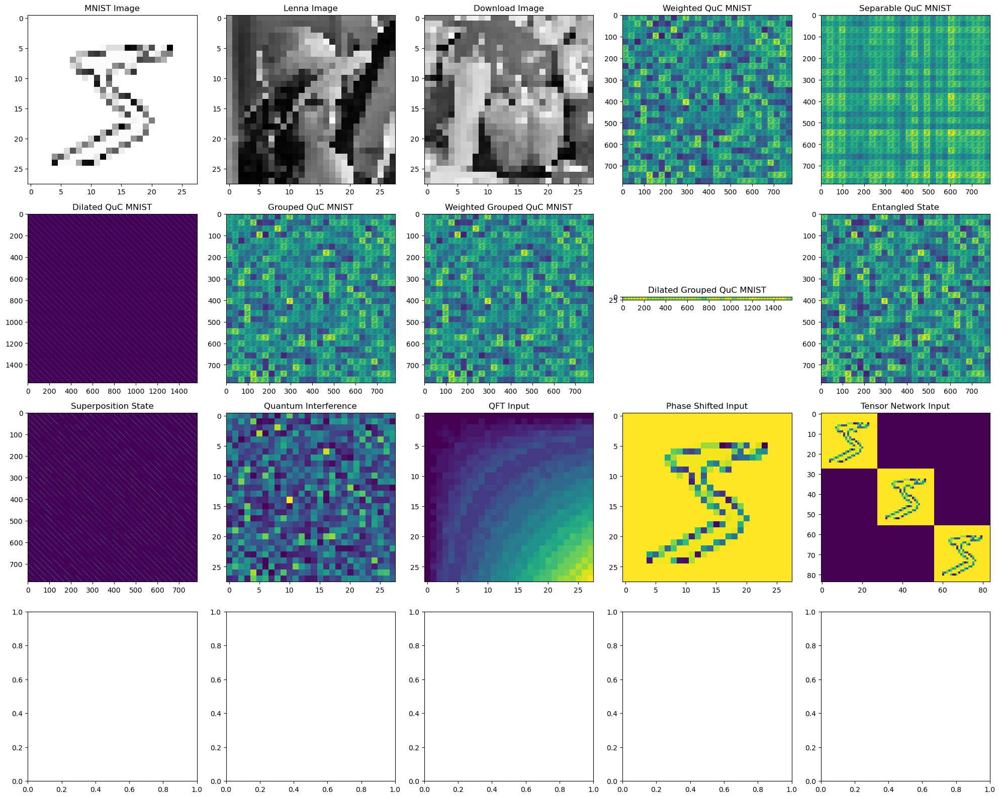

In [43]:
import numpy as np
import cv2
import torch
import torchvision.transforms as transforms
from torchvision import datasets
from scipy.linalg import block_diag
import matplotlib.pyplot as plt

# Load the MNIST dataset using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Load the Lenna image
lenna_image = cv2.imread('C:/Users/ACER/Desktop/lena_256.jpg', cv2.IMREAD_GRAYSCALE)
lenna_image = cv2.resize(lenna_image, (28, 28))
q_lenna_image = lenna_image / 255.0

# Load the download image
download_image = cv2.imread('C:/Users/ACER/Desktop/download.jpg', cv2.IMREAD_GRAYSCALE)
download_image = cv2.resize(download_image, (28, 28))
q_download_image = download_image / 255.0

# Define quantum convolution operations
def Qc_weighted(q_i, q_k_bar, weights):
    return sum(weights[k] * np.kron(q_k, q_i) for k, q_k in enumerate(q_k_bar))

def Qc_separable(q_i, q_kx, q_ky):
    return np.kron(q_kx, np.identity(q_i.shape[0])) @ np.kron(np.identity(q_i.shape[0]), q_i) @ np.kron(q_ky, np.identity(q_i.shape[0]))

def Qc_dilated(q_i, q_k, d):
    I_d = np.identity(q_i.shape[0] * d)
    return np.kron(q_k, I_d) @ np.kron(q_i, I_d)

def Qc_grouped(q_i, q_k_groups):
    return sum(Qc_weighted(q_i, q_k_group, [1] * len(q_k_group)) for q_k_group in q_k_groups)

def Qc_weighted_grouped(q_i, q_k_groups, weights):
    return sum(weights[g] * Qc_weighted(q_i, q_k_groups[g], [1] * len(q_k_groups[g])) for g in range(len(q_k_groups)))

def dilate(kernel, dilation_rate):
    dilated_kernel = np.kron(kernel, np.eye(dilation_rate))
    return dilated_kernel

def Qc_dilated_grouped(q_i, q_k, d):
    return Qc_weighted_grouped(q_i, [dilate(q, d) for q in q_k], [1] * len(q_k))

def entangled_state(q_i, q_k):
    alpha = np.random.rand(len(q_k))
    alpha /= np.linalg.norm(alpha)
    return sum(alpha[i] * np.kron(q_k[i], q_i[i]) for i in range(len(q_i)))

def superposition_state(q_k):
    n = len(q_k)
    return (1/np.sqrt(n)) * sum(np.kron(q_k[i], np.eye(q_k[i].shape[0])) for i in range(n))

def quantum_interference(q_k, phases):
    return np.abs(sum(np.exp(1j * phases[i]) * q_k[i] for i in range(len(q_k))))**2

def depthwise_kernels(q_k):
    depthwise = [q for q in q_k]
    pointwise = [np.eye(q.shape[0]) for q in q_k]
    return depthwise, pointwise

def QFT(q):
    n = q.shape[0]
    omega = np.exp(2j * np.pi / n)
    return np.array([[omega**(i*j) for j in range(n)] for i in range(n)]) / np.sqrt(n)

def phase_shift(q, theta):
    return q * np.exp(1j * theta)

def tensor_network(q):
    return block_diag(*q)

# Define kernels and weights for demonstration
kernels = [np.random.rand(28, 28) for _ in range(3)]
weights = [0.2, 0.3, 0.5]
dilation_rate = 2
phases = [0, np.pi/4, np.pi/2]

# Apply quantum convolution operations
Qc_w_image = Qc_weighted(q_image, kernels, weights)
Qc_sep_image = Qc_separable(q_image, kernels[0], kernels[1])
Qc_dil_image = Qc_dilated(q_image, kernels[0], dilation_rate)
Qc_grp_image = Qc_grouped(q_image, [kernels])
Qc_w_grp_image = Qc_weighted_grouped(q_image, [kernels], weights)
Qc_dil_grp_image = Qc_dilated_grouped(q_image, kernels, dilation_rate)
entangled_image = entangled_state([q_image]*3, kernels)
superposition_image = superposition_state(kernels)
interference_image = quantum_interference(kernels, phases)
depthwise, pointwise = depthwise_kernels(kernels)
qft_q_image = QFT(q_image)
phase_q_image = phase_shift(q_image, np.pi/3)
tensor_q_image = tensor_network([q_image]*3)

# Plot results
fig, axs = plt.subplots(4, 5, figsize=(20, 16))
axs[0, 0].imshow(q_image, cmap='gray')
axs[0, 0].set_title('MNIST Image')
axs[0, 1].imshow(q_lenna_image, cmap='gray')
axs[0, 1].set_title('Lenna Image')
axs[0, 2].imshow(q_download_image, cmap='gray')
axs[0, 2].set_title('Download Image')
axs[0, 3].imshow(np.abs(Qc_w_image), cmap='viridis')
axs[0, 3].set_title('Weighted QuC MNIST')
axs[0, 4].imshow(np.abs(Qc_sep_image), cmap='viridis')
axs[0, 4].set_title('Separable QuC MNIST')
axs[1, 0].imshow(np.abs(Qc_dil_image), cmap='viridis')
axs[1, 0].set_title('Dilated QuC MNIST')
axs[1, 1].imshow(np.abs(Qc_grp_image), cmap='viridis')
axs[1, 1].set_title('Grouped QuC MNIST')
axs[1, 2].imshow(np.abs(Qc_w_grp_image), cmap='viridis')
axs[1, 2].set_title('Weighted Grouped QuC MNIST')
axs[1, 3].imshow(np.abs(Qc_dil_grp_image), cmap='viridis')
axs[1, 3].set_title('Dilated Grouped QuC MNIST')
axs[1, 4].imshow(np.abs(entangled_image), cmap='viridis')
axs[1, 4].set_title('Entangled State')
axs[2, 0].imshow(np.abs(superposition_image), cmap='viridis')
axs[2, 0].set_title('Superposition State')
axs[2, 1].imshow(np.abs(interference_image), cmap='viridis')
axs[2, 1].set_title('Quantum Interference')
axs[2, 2].imshow(np.abs(qft_q_image), cmap='viridis')
axs[2, 2].set_title('QFT Input')
axs[2, 3].imshow(np.abs(phase_q_image), cmap='viridis')
axs[2, 3].set_title('Phase Shifted Input')
axs[2, 4].imshow(np.abs(tensor_q_image), cmap='viridis')
axs[2, 4].set_title('Tensor Network Input')

plt.tight_layout()
plt.show()


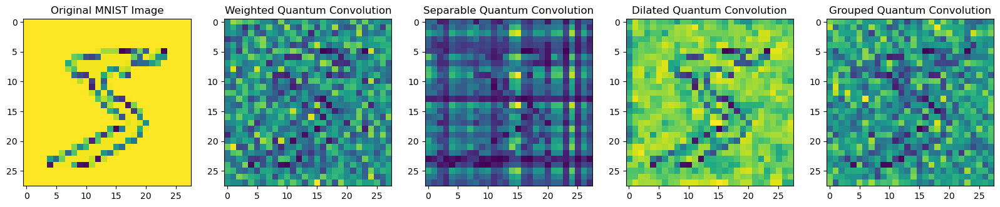

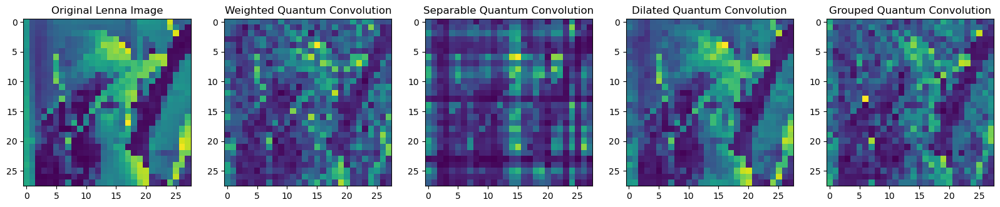

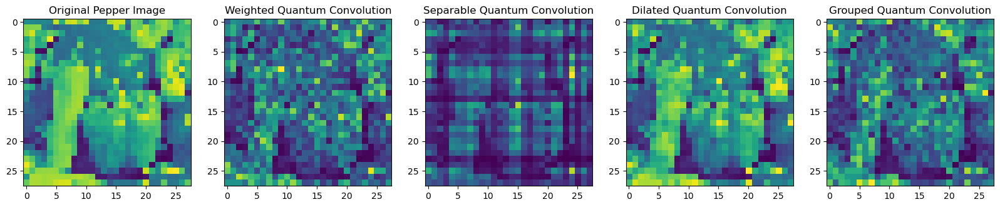

In [19]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
import cv2

# Define the transform for the MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
image, _ = trainset[0]
q_image = np.abs(image.numpy()[0])

# Load and process the Lenna image
lenna_image = cv2.imread('C:/Users/ACER/Desktop/lena_256.jpg', cv2.IMREAD_GRAYSCALE)
lenna_image = cv2.resize(lenna_image, (28, 28))
q_lenna_image = lenna_image / 255.0

# Load and process another image
download_image = cv2.imread('C:/Users/ACER/Desktop/download.jpg', cv2.IMREAD_GRAYSCALE)
download_image = cv2.resize(download_image, (28, 28))
q_download_image = download_image / 255.0

# Define a function to apply the weighted quantum convolution
def quantum_convolution_weighted(q_i, q_k, weights):
    result = np.zeros_like(q_i)
    for k, w in zip(q_k, weights):
        result += w * (k * q_i)
    return result

# Define a function to apply the separable quantum convolution
def quantum_convolution_separable(q_i, q_kx, q_ky):
    result = np.zeros_like(q_i)
    for kx, ky in zip(q_kx, q_ky):
        result += np.outer(kx, ky) * q_i
    return result

# Define a function to apply the dilated quantum convolution
def quantum_convolution_dilated(q_i, q_k, d):
    result = np.zeros_like(q_i)
    for k in q_k:
        dilated_k = cv2.dilate(k, np.ones((d, d), np.uint8))
        result += dilated_k * q_i
    return result

# Define a function to apply the grouped quantum convolution
def quantum_convolution_grouped(q_i, q_kgroups):
    result = np.zeros_like(q_i)
    for group in q_kgroups:
        group_result = np.zeros_like(q_i)
        for k in group:
            group_result += k * q_i
        result += group_result
    return result

# Example kernels and weights
kernels = [np.random.rand(28, 28) for _ in range(3)]
weights = [0.3, 0.5, 0.2]
kx = [np.random.rand(28) for _ in range(3)]
ky = [np.random.rand(28) for _ in range(3)]
groups = [[np.random.rand(28, 28) for _ in range(2)], [np.random.rand(28, 28) for _ in range(2)]]
dilation_rate = 2

# Apply the quantum convolution operations to the MNIST image
q_weighted = quantum_convolution_weighted(q_image, kernels, weights)
q_separable = quantum_convolution_separable(q_image, kx, ky)
q_dilated = quantum_convolution_dilated(q_image, kernels, dilation_rate)
q_grouped = quantum_convolution_grouped(q_image, groups)

# Plot the results for MNIST image
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
axes[0].imshow(q_image, cmap='viridis')
axes[0].set_title('Original MNIST Image')
axes[1].imshow(q_weighted, cmap='viridis')
axes[1].set_title('Weighted Quantum Convolution')
axes[2].imshow(q_separable, cmap='viridis')
axes[2].set_title('Separable Quantum Convolution')
axes[3].imshow(q_dilated, cmap='viridis')
axes[3].set_title('Dilated Quantum Convolution')
axes[4].imshow(q_grouped, cmap='viridis')
axes[4].set_title('Grouped Quantum Convolution')
plt.savefig("aaaa1.svg")
plt.show()

# Apply the quantum convolution operations to the Lenna image
q_weighted_lenna = quantum_convolution_weighted(q_lenna_image, kernels, weights)
q_separable_lenna = quantum_convolution_separable(q_lenna_image, kx, ky)
q_dilated_lenna = quantum_convolution_dilated(q_lenna_image, kernels, dilation_rate)
q_grouped_lenna = quantum_convolution_grouped(q_lenna_image, groups)

# Plot the results for Lenna image
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
axes[0].imshow(q_lenna_image, cmap='viridis')
axes[0].set_title('Original Lenna Image')
axes[1].imshow(q_weighted_lenna, cmap='viridis')
axes[1].set_title('Weighted Quantum Convolution')
axes[2].imshow(q_separable_lenna, cmap='viridis')
axes[2].set_title('Separable Quantum Convolution')
axes[3].imshow(q_dilated_lenna, cmap='viridis')
axes[3].set_title('Dilated Quantum Convolution')
axes[4].imshow(q_grouped_lenna, cmap='viridis')
axes[4].set_title('Grouped Quantum Convolution')
plt.savefig("aaaa2.svg")
plt.show()

# Apply the quantum convolution operations to the downloaded image
q_weighted_download = quantum_convolution_weighted(q_download_image, kernels, weights)
q_separable_download = quantum_convolution_separable(q_download_image, kx, ky)
q_dilated_download = quantum_convolution_dilated(q_download_image, kernels, dilation_rate)
q_grouped_download = quantum_convolution_grouped(q_download_image, groups)

# Plot the results for downloaded image
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
axes[0].imshow(q_download_image, cmap='viridis')
axes[0].set_title('Original Pepper Image')
axes[1].imshow(q_weighted_download, cmap='viridis')
axes[1].set_title('Weighted Quantum Convolution')
axes[2].imshow(q_separable_download, cmap='viridis')
axes[2].set_title('Separable Quantum Convolution')
axes[3].imshow(q_dilated_download, cmap='viridis')
axes[3].set_title('Dilated Quantum Convolution')
axes[4].imshow(q_grouped_download, cmap='viridis')
axes[4].set_title('Grouped Quantum Convolution')
plt.savefig("aaaa3.svg")
plt.show()
